<h1><center>Insurance Claim Prediction</center></h1>

In [78]:
## Import all necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
import sklearn.metrics as metrics
from sklearn.preprocessing import MinMaxScaler 
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, FunctionTransformer, RobustScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from copy import deepcopy
import scipy.stats as stats
import pickle
pickle.dump(pipeline,open('insurance.pkl','wb'))

import warnings
warnings.filterwarnings('ignore', category=ImportWarning)

In [7]:
## Import DataSet

df = pd.read_csv(r'D:\Data_Science\Projects\Projects\Insurance Claim Prediction\insurance_data.csv')

df.head()

,index,PatientID,age,gender,bmi,bloodpressure,diabetic,children,smoker,region,claim
0,0,1,39.0,male,23.2,91,Yes,0,No,southeast,1121.87
1,1,2,24.0,male,30.1,87,No,0,No,southeast,1131.51
2,2,3,NaN,male,33.3,82,Yes,0,No,southeast,1135.94
3,3,4,NaN,male,33.7,80,No,0,No,northwest,1136.40
4,4,5,NaN,male,34.1,100,No,0,No,northwest,1137.01


## Data Cleaning

In [7]:
## Dimension of the Data

df.shape

(1340, 11)

In [8]:
## Information of DataSet

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1340 entries, 0 to 1339
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   index          1340 non-null   int64  
 1   PatientID      1340 non-null   int64  
 2   age            1335 non-null   float64
 3   gender         1340 non-null   object 
 4   bmi            1340 non-null   float64
 5   bloodpressure  1340 non-null   int64  
 6   diabetic       1340 non-null   object 
 7   children       1340 non-null   int64  
 8   smoker         1340 non-null   object 
 9   region         1337 non-null   object 
 10  claim          1340 non-null   float64
dtypes: float64(3), int64(4), object(4)
memory usage: 115.3+ KB


In [11]:
## Check null values

df.isna().sum()

index            0
PatientID        0
age              5
gender           0
bmi              0
bloodpressure    0
diabetic         0
children         0
smoker           0
region           3
claim            0
dtype: int64

In [98]:
## Drop unnecessary columns

df = df.drop(columns = ['index', 'PatientID'])

df.head()

,age,gender,bmi,bloodpressure,diabetic,children,smoker,region,claim
0,39.0,male,23.2,91,Yes,0,No,southeast,1121.87
1,24.0,male,30.1,87,No,0,No,southeast,1131.51
2,NaN,male,33.3,82,Yes,0,No,southeast,1135.94
3,NaN,male,33.7,80,No,0,No,northwest,1136.40
4,NaN,male,34.1,100,No,0,No,northwest,1137.01


## EDA

* Analysis and Reporting
* Validate Assumptions
* Handling Missing Values
* Detecting Outliers
* Feature Engineering
* Model Building

**Separate out Categorical and Numerical Features**

In [16]:
cat_cols = df.select_dtypes(exclude = np.number).columns.to_list()

cat_cols

['gender', 'diabetic', 'smoker', 'region']

In [18]:
num_cols = df.select_dtypes(include = np.number).columns.to_list()

num_cols

['age', 'bmi', 'bloodpressure', 'children', 'claim']

**Categorical Data Frame**

In [46]:
cat_df = pd.DataFrame()

## UniVariant EDA

**AGE**

In [24]:
df['age'].describe()

count    1335.000000
mean       38.078652
std        11.102924
min        18.000000
25%        29.000000
50%        38.000000
75%        47.000000
max        60.000000
Name: age, dtype: float64

C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='age', ylabel='Count'>

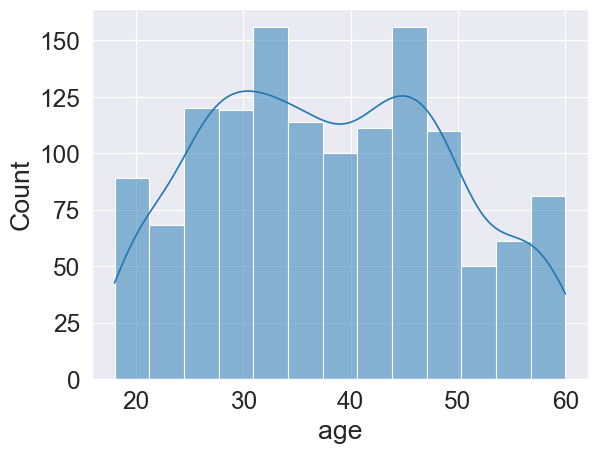

In [26]:
sns.histplot(df['age'], kde = True)

C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='age', ylabel='Density'>

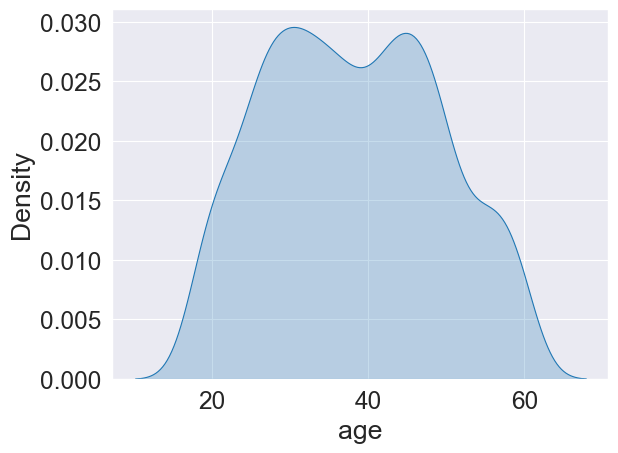

In [29]:
sns.kdeplot(df['age'], fill = True)

In [30]:
df['age'].skew()

0.11361133741072633

<Axes: >

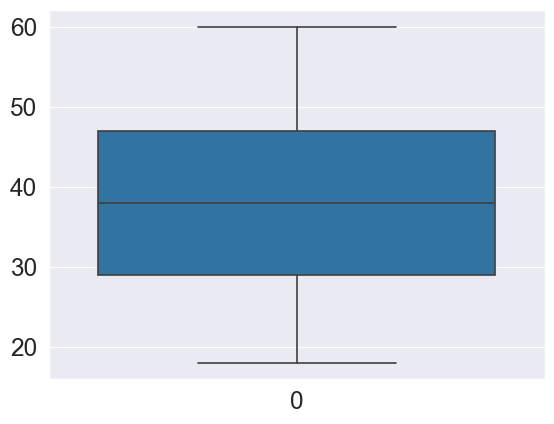

In [31]:
sns.boxplot(df['age'])

**OBSERVATIONS**

* **Missing Values :-** 3
* **Shape :-** Appears bimodal, with peaks around 30-35 and 40-45
* **Outliers :-** No

**BMI**

In [35]:
df['bmi'].describe()

count    1340.000000
mean       30.668955
std         6.106735
min        16.000000
25%        26.275000
50%        30.400000
75%        34.700000
max        53.100000
Name: bmi, dtype: float64

C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='bmi', ylabel='Count'>

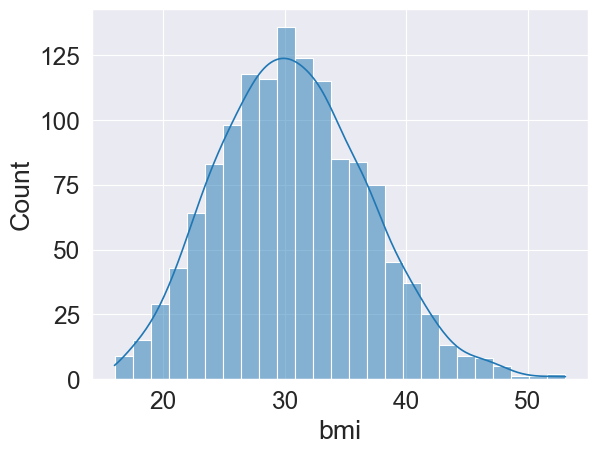

In [36]:
sns.histplot(df['bmi'], kde = True)

C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='bmi', ylabel='Density'>

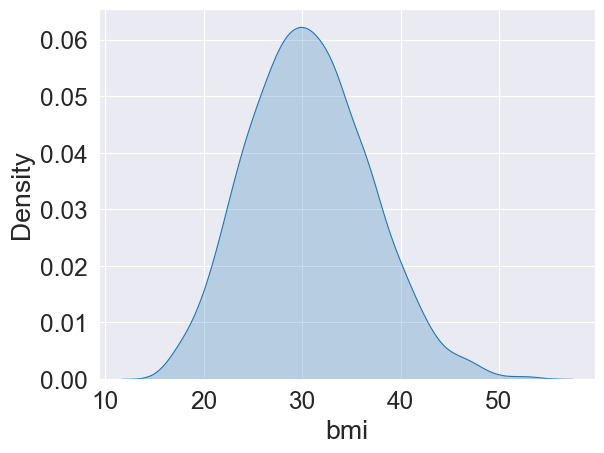

In [37]:
sns.kdeplot(df['bmi'], fill = True)

**OBERVATIONS**

* **Missing Values :-** 0
* **Shape :-** Noraml Distriubution
* **Outliers :-** 4 max

**Outliers Detection of BMI**

<Axes: >

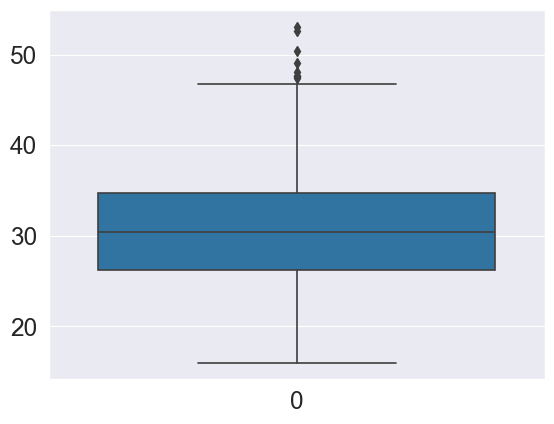

In [38]:
sns.boxplot(df['bmi'])

In [39]:
upper_limit = df['bmi'].mean() + 3 * df['bmi'].std()

upper_limit

48.9891595244066

In [41]:
df[df['bmi'] > upper_limit].shape

(4, 9)

**Removing Outliers of BMI**

In [43]:
df['bmi'] = np.where(df['bmi'] >upper_limit,upper_limit,df['bmi'])

df[df['bmi']>upper_limit].shape

(0, 9)

In [47]:
def bmi_categorizer(bmi):
    if bmi < 18.5:
        return "Underweight"
    elif 18.5 <= bmi < 24.9:
        return "Healthy"
    elif 25 <= bmi < 29.9:
        return "Overweight"
    elif bmi >= 30 and bmi < 40:
        return "Obese"
    else:
        return "Very Obese"

cat_df['bmi'] = df['bmi'].apply(bmi_categorizer)

<Axes: ylabel='count'>

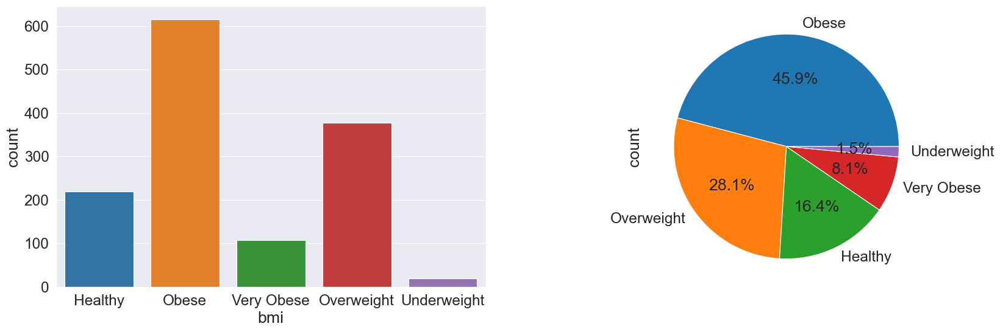

In [52]:
fig = plt.figure(figsize=(20,6))
(ax1,ax2) = fig.subplots(1,2)
sns.countplot(x=cat_df['bmi'],ax=ax1)
cat_df['bmi'].value_counts().plot(kind='pie',autopct='%0.1f%%',ax=ax2)

**Blood Pressure**

In [56]:
df['bloodpressure'].describe()

count    1340.000000
mean       94.157463
std        11.434712
min        80.000000
25%        86.000000
50%        92.000000
75%        99.000000
max       140.000000
Name: bloodpressure, dtype: float64

C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='bloodpressure', ylabel='Count'>

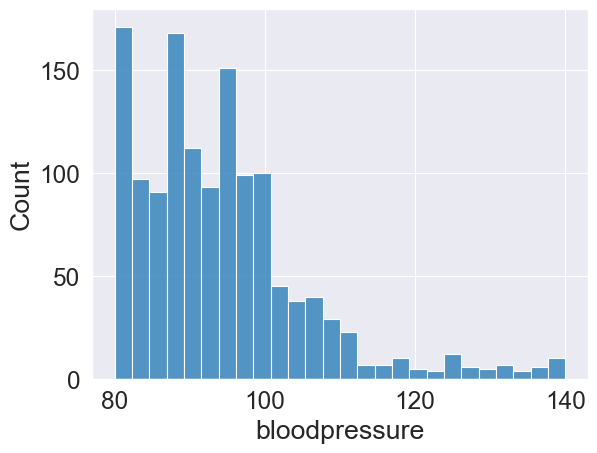

In [58]:
sns.histplot(df['bloodpressure'], kde = False)

C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='bloodpressure', ylabel='Density'>

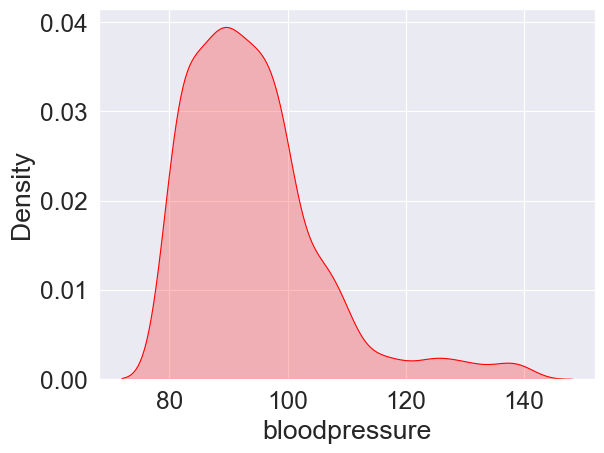

In [61]:
sns.kdeplot(df['bloodpressure'], fill = True, color = 'red', cbar = True)

<Axes: >

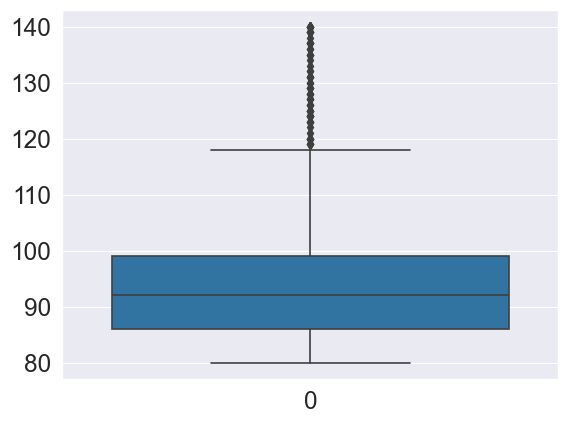

In [63]:
sns.boxplot(df['bloodpressure'])

**Outliers Detection Based on BloodPressure**

In [69]:
iqr = df['bloodpressure'].quantile(0.75) - df['bloodpressure'].quantile(0.25)
upper_limit = df['bloodpressure'].quantile(0.75) + iqr * 1.5

df[df['bloodpressure'] > upper_limit].shape

(62, 9)

**Removing Outliers Based on BloodPressure**

In [71]:
df['bloodpressure']= np.where(df['bloodpressure'] >upper_limit,upper_limit,df['bloodpressure'])

df[df['bloodpressure']>upper_limit].shape

(0, 9)

In [73]:
def bp_categorizer(bp):
    if 80<=bp < 89:
        return "elevated"
    elif 90<= bp <= 99:
        return "High"
    elif  99< bp <100:
        return "very high"
    elif 100<=bp<120:
        return "extremely high"
    else:
        return "fatal"

cat_df['bloodpressure'] = df['bloodpressure'].apply(bp_categorizer)

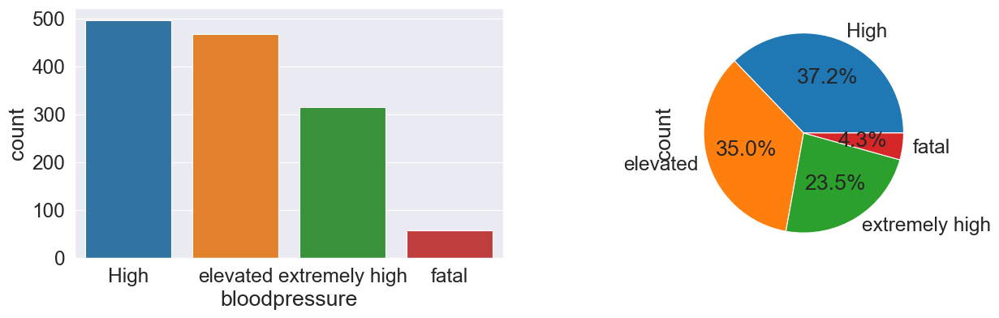

In [74]:
fig = plt.figure(figsize=(15,4))
(ax1,ax2) = fig.subplots(1,2)
sns.countplot(x=cat_df['bloodpressure'],ax=ax1)
cat_df['bloodpressure'].value_counts().plot(kind='pie',autopct='%0.1f%%',ax=ax2)

**OBSERVATIONS**

* **Missing Values :-** 0
* **Shape :-** Highly Positive Skewed
* **Outliers :-** 4.6 % Outliers
* Highly positively skewed.
* Approximately 35% of patients exhibit elevated BP, while 4.3% are in a critical state (fatal).

**CLAIM**

In [76]:
df['claim'].describe()

count     1340.000000
mean     13252.745642
std      12109.609288
min       1121.870000
25%       4719.685000
50%       9369.615000
75%      16604.305000
max      63770.430000
Name: claim, dtype: float64

In [77]:
df['claim'].skew()

1.5167468509489237

C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='claim', ylabel='Count'>

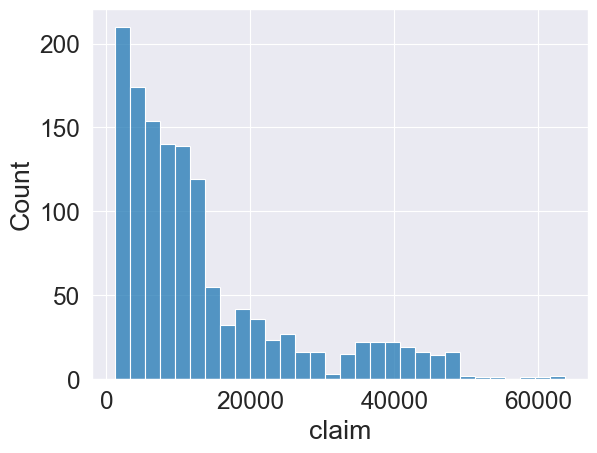

In [78]:
sns.histplot(df['claim'], kde = False)

C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='claim', ylabel='Density'>

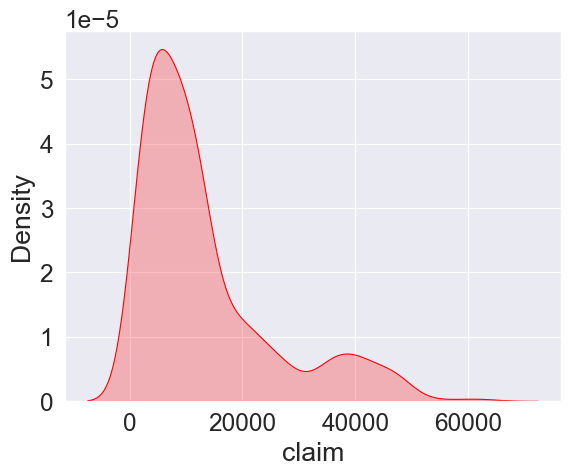

In [79]:
sns.kdeplot(df['claim'], fill = True, color = 'red')

<Axes: >

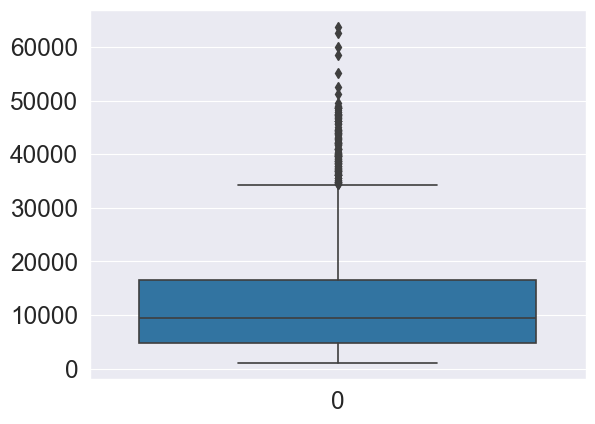

In [80]:
sns.boxplot(df['claim'])

**Outliers Detection Based on Claim**

In [84]:
iqr = df['claim'].quantile(0.75) - df['claim'].quantile(0.25)
upper_limit = df['claim'].quantile(0.75) + iqr * 1.5

df[df['claim'] > upper_limit].shape[0]

141

**Removing Outliers Based on Claim**

In [87]:
df['claim'] = np.where(df['claim'] >upper_limit,upper_limit,df['claim'])

df[df['claim'] > upper_limit].shape

(0, 9)

**OBSERVATIONS**

* **Missing Values :-** 0
* **Shape :-** Positive Skewed
* **Outliers :-** 4.6 % Outliers

## Bivariant EDA

**GENDER**

<Axes: ylabel='count'>

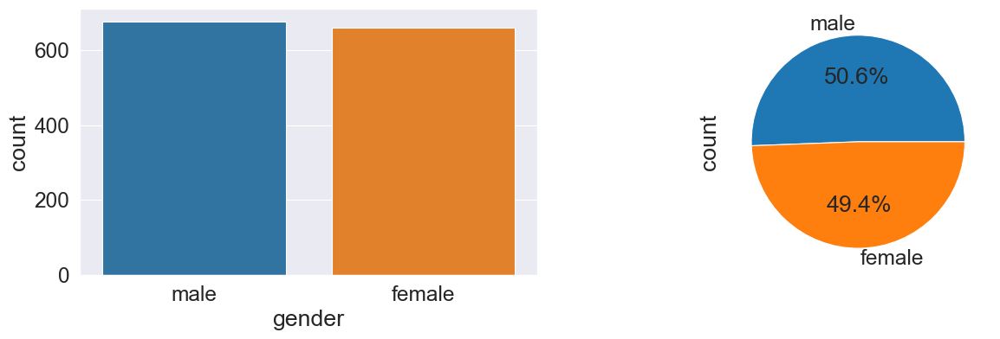

In [89]:
fig = plt.figure(figsize=(15,4))
(ax1,ax2) = fig.subplots(1,2)
sns.countplot(x=df['gender'],ax=ax1)
df['gender'].value_counts().plot(kind='pie',autopct='%0.1f%%',ax=ax2)

**DIABETIC**

<Axes: ylabel='count'>

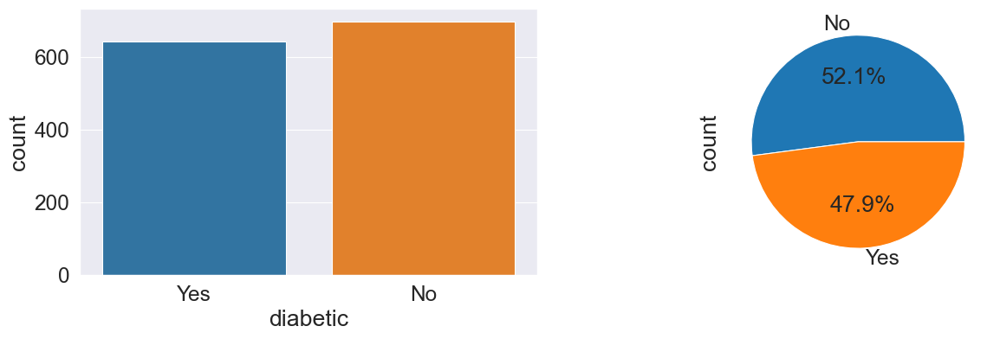

In [90]:
fig = plt.figure(figsize=(15,4))
(ax1,ax2) = fig.subplots(1,2)
sns.countplot(x=df['diabetic'],ax=ax1)
df['diabetic'].value_counts().plot(kind='pie',autopct='%0.1f%%',ax=ax2)

**REGION**

<Axes: ylabel='count'>

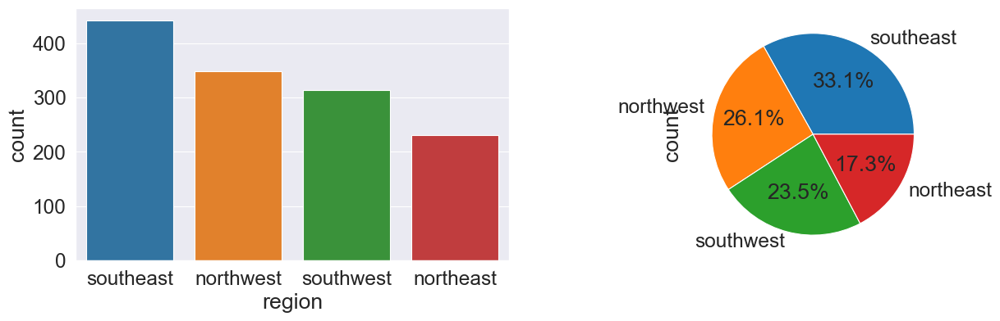

In [94]:
fig = plt.figure(figsize=(15,4))
(ax1,ax2) = fig.subplots(1,2)
sns.countplot(x=df['region'],ax=ax1)
df['region'].value_counts().plot(kind='pie',autopct='%0.1f%%',ax=ax2)

**SMOKER**

<Axes: ylabel='count'>

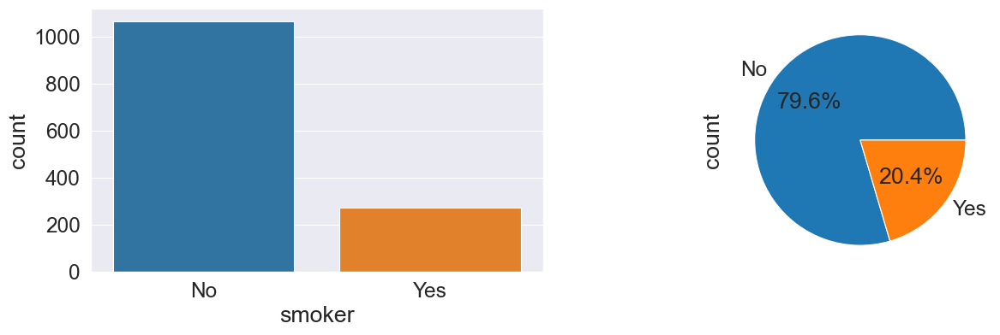

In [95]:
fig = plt.figure(figsize=(15,4))
(ax1,ax2) = fig.subplots(1,2)
sns.countplot(x=df['smoker'],ax=ax1)
df['smoker'].value_counts().plot(kind='pie',autopct='%0.1f%%',ax=ax2)

## Categorical to Categorical

* Gender with Diabetic
* Gender with Smoker
* Gender with Region
* Gender with BloodPressure
* Gender with BMI
* Diabetic with Smoker
* Diabetic with Children
* Diabetic with Region
* Diabetic with BloodPressure
* Diabetic with BMI
* Children with Smoker
* Smoker with Region
* Smoker with BloodPressure
* Smoker with BMI

**Gender with Diabetic**

In [117]:
pd.crosstab(df['gender'], df['diabetic'])

diabetic,No,Yes
gender,,
female,339,323
male,359,319


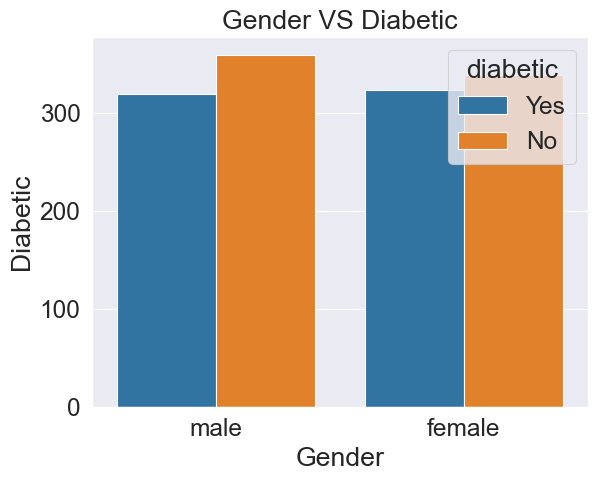

In [118]:
sns.countplot(x=df['gender'], hue=df['diabetic'])
plt.xlabel('Gender')
plt.ylabel('Diabetic')
plt.title('Gender VS Diabetic')
plt.show()

**Gender with Smoker**

In [119]:
pd.crosstab(df['gender'], df['smoker'])

smoker,No,Yes
gender,,
female,547,115
male,519,159


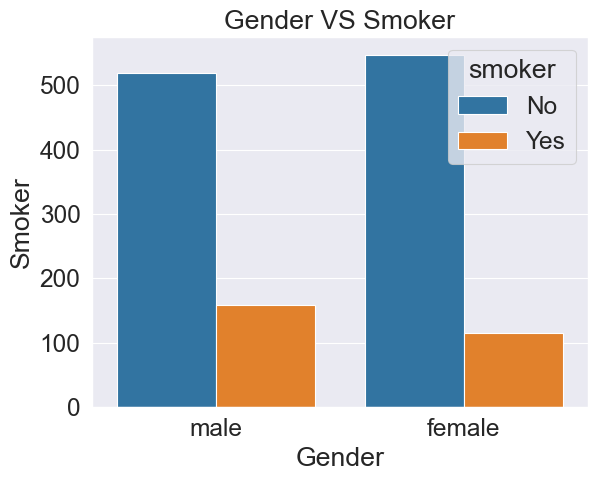

In [120]:
sns.countplot(x=df['gender'], hue=df['smoker'])
plt.xlabel('Gender')
plt.ylabel('Smoker')
plt.title('Gender VS Smoker')
plt.show()

**Gender with Region**

In [121]:
pd.crosstab(df['gender'], df['region'])

region,northeast,northwest,southeast,southwest
gender,,,,
female,112,164,224,162
male,119,185,219,152


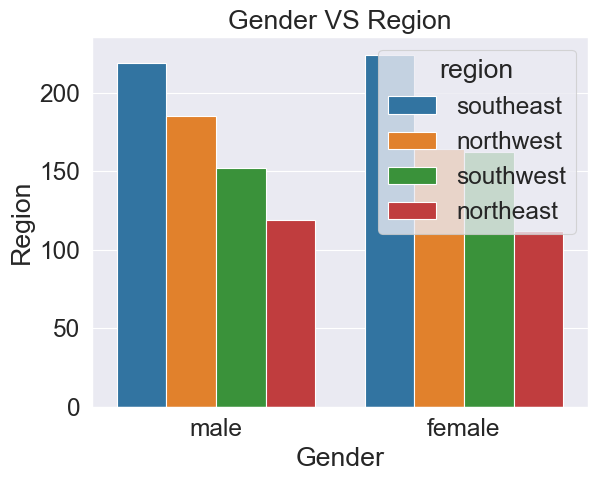

In [122]:
sns.countplot(x=df['gender'], hue=df['region'])
plt.xlabel('Gender')
plt.ylabel('Region')
plt.title('Gender VS Region')
plt.show()

**Gender with BloodPressure**

In [123]:
pd.crosstab(df['gender'], df['bloodpressure'])

bloodpressure,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,...,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,118.5
gender,,,,,,,,,,,,,,,,,,,,,
female,33,24,28,30,24,17,22,31,26,23,...,9,4,1,1,1,2,0,1,2,27
male,26,34,26,24,19,24,28,21,32,35,...,8,0,1,1,4,4,1,4,0,35


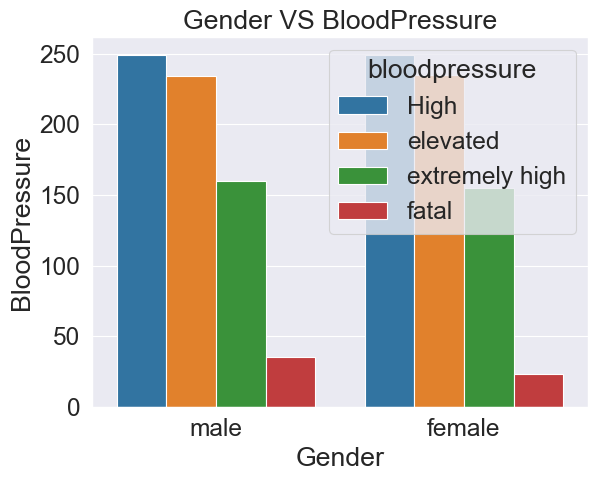

In [147]:
sns.countplot(x=df['gender'], hue=cat_df['bloodpressure'])
plt.xlabel('Gender')
plt.ylabel('BloodPressure')
plt.title('Gender VS BloodPressure')
plt.show()

**Gender with BMI**

In [125]:
pd.crosstab(df['gender'], df['bmi'])

bmi,16.00000,16.80000,17.20000,17.30000,17.40000,17.50000,17.70000,17.80000,17.90000,18.00000,...,46.20000,46.50000,46.70000,46.80000,47.40000,47.50000,47.60000,47.70000,48.10000,48.98916
gender,,,,,,,,,,,,,,,,,,,,,
female,0,1,1,2,1,0,0,2,0,1,...,1,0,1,1,1,0,1,0,1,0
male,1,1,0,1,1,1,1,0,1,0,...,0,3,0,0,0,1,0,1,0,4


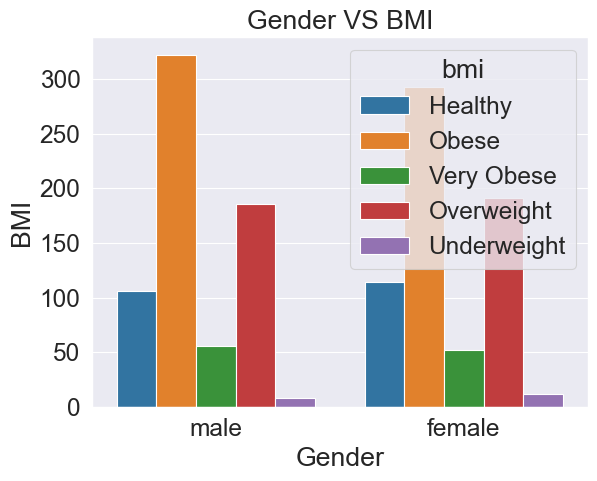

In [148]:
sns.countplot(x=df['gender'], hue=cat_df['bmi'])
plt.xlabel('Gender')
plt.ylabel('BMI')
plt.title('Gender VS BMI')
plt.show()

**Diabetic with Smoker**

In [129]:
pd.crosstab(df['diabetic'], df['smoker'])

smoker,No,Yes
diabetic,,
No,560,138
Yes,506,136


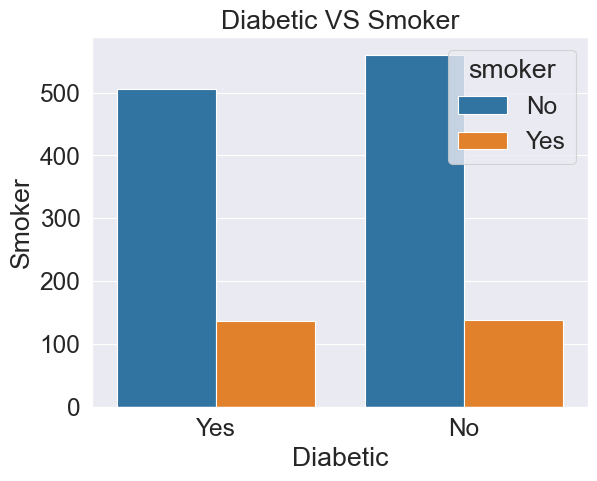

In [130]:
sns.countplot(x=df['diabetic'], hue=df['smoker'])
plt.xlabel('Diabetic')
plt.ylabel('Smoker')
plt.title('Diabetic VS Smoker')
plt.show()

**Diabetic with Children**

In [131]:
pd.crosstab(df['diabetic'], df['children'])

children,0,1,2,3,4,5
diabetic,,,,,,
No,292,179,120,83,13,11
Yes,284,145,120,74,12,7


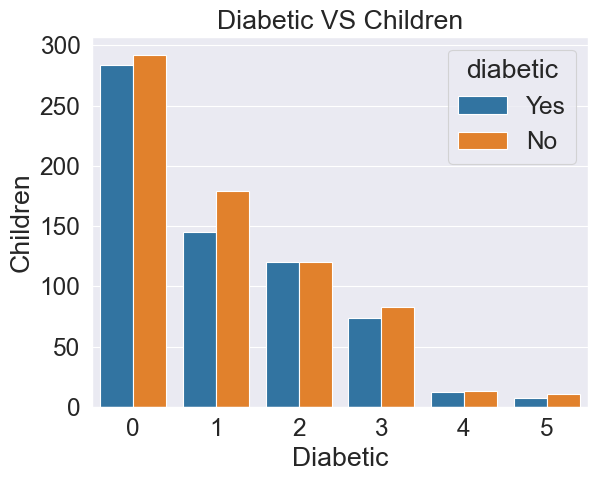

In [150]:
sns.countplot(x=df['children'], hue=df['diabetic'])
plt.xlabel('Diabetic')
plt.ylabel('Children')
plt.title('Diabetic VS Children')
plt.show()

**Diabetic with Region**

In [133]:
pd.crosstab(df['diabetic'], df['region'])

region,northeast,northwest,southeast,southwest
diabetic,,,,
No,110,192,225,170
Yes,121,157,218,144


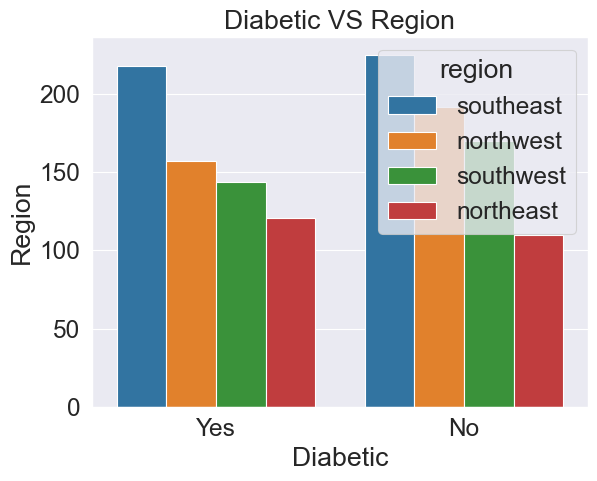

In [134]:
sns.countplot(x=df['diabetic'], hue=df['region'])
plt.xlabel('Diabetic')
plt.ylabel('Region')
plt.title('Diabetic VS Region')
plt.show()

**Diabetic with BloodPressure**

In [135]:
pd.crosstab(df['diabetic'], df['diabetic'])

diabetic,No,Yes
diabetic,,
No,698,0
Yes,0,642


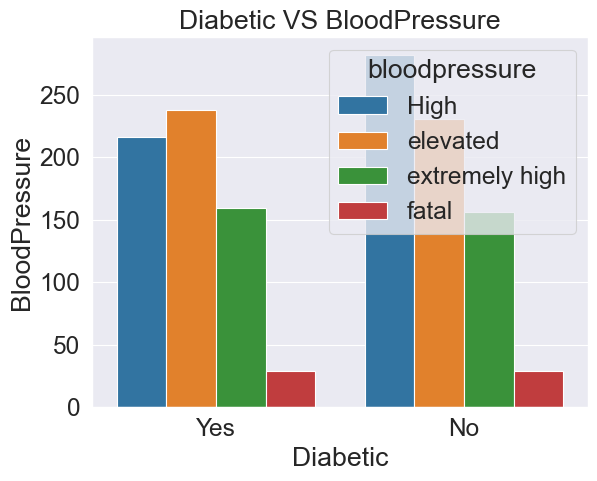

In [151]:
sns.countplot(x=df['diabetic'], hue=cat_df['bloodpressure'])
plt.xlabel('Diabetic')
plt.ylabel('BloodPressure')
plt.title('Diabetic VS BloodPressure')
plt.show()

**Diabetic with BMI**

In [137]:
pd.crosstab(df['diabetic'], df['bmi'])

bmi,16.00000,16.80000,17.20000,17.30000,17.40000,17.50000,17.70000,17.80000,17.90000,18.00000,...,46.20000,46.50000,46.70000,46.80000,47.40000,47.50000,47.60000,47.70000,48.10000,48.98916
diabetic,,,,,,,,,,,,,,,,,,,,,
No,1,1,0,1,2,0,0,2,1,0,...,1,2,0,1,1,0,0,1,0,2
Yes,0,1,1,2,0,1,1,0,0,1,...,0,1,1,0,0,1,1,0,1,2


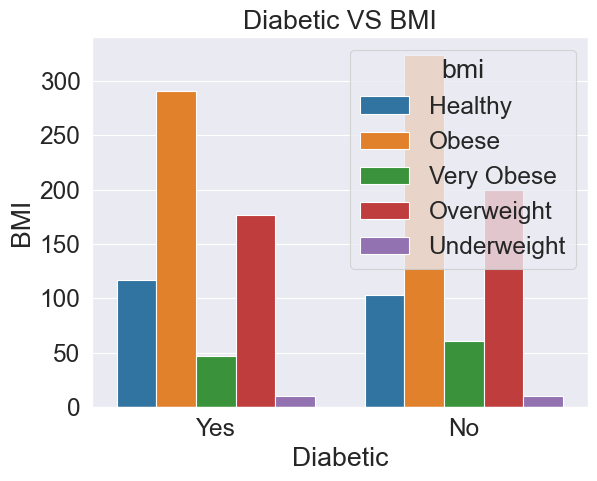

In [152]:
sns.countplot(x=df['diabetic'], hue=cat_df['bmi'])
plt.xlabel('Diabetic')
plt.ylabel('BMI')
plt.title('Diabetic VS BMI')
plt.show()

**Children with Smoker**

In [139]:
pd.crosstab(df['children'], df['diabetic'])

diabetic,No,Yes
children,,
0,292,284
1,179,145
2,120,120
3,83,74
4,13,12
5,11,7


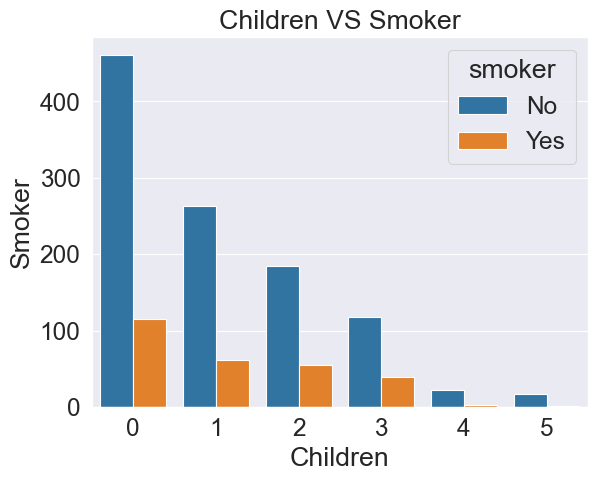

In [140]:
sns.countplot(x=df['children'], hue=df['smoker'])
plt.xlabel('Children')
plt.ylabel('Smoker')
plt.title('Children VS Smoker')
plt.show()

**Smoker with Region**

In [141]:
pd.crosstab(df['smoker'], df['region'])

region,northeast,northwest,southeast,southwest
smoker,,,,
No,164,291,352,256
Yes,67,58,91,58


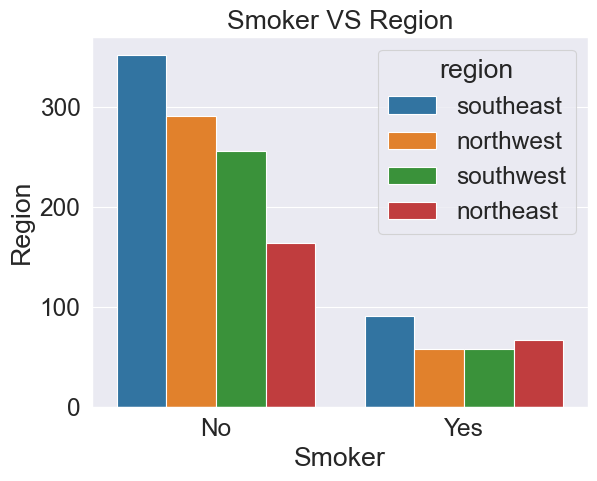

In [142]:
sns.countplot(x=df['smoker'], hue=df['region'])
plt.xlabel('Smoker')
plt.ylabel('Region')
plt.title('Smoker VS Region')
plt.show()

**Smoker with BloodPressure**

In [143]:
pd.crosstab(df['smoker'], df['bloodpressure'])

bloodpressure,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,...,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,118.5
smoker,,,,,,,,,,,,,,,,,,,,,
No,54,49,47,47,38,36,44,43,53,50,...,12,0,0,0,0,0,0,0,2,9
Yes,5,9,7,7,5,5,6,9,5,8,...,5,4,2,2,5,6,1,5,0,53


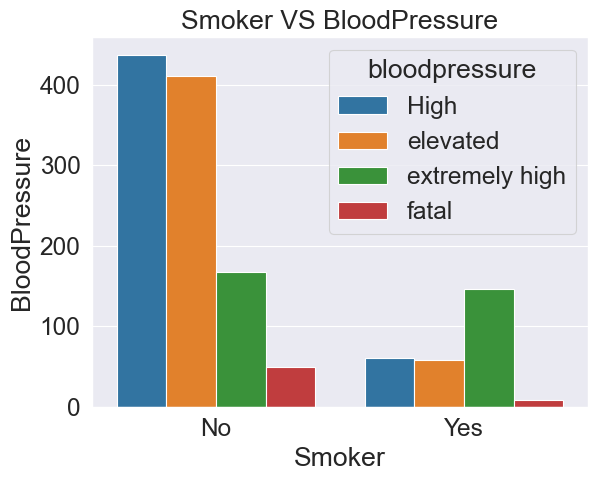

In [153]:
sns.countplot(x=df['smoker'], hue=cat_df['bloodpressure'])
plt.xlabel('Smoker')
plt.ylabel('BloodPressure')
plt.title('Smoker VS BloodPressure')
plt.show()

**Smoker with BMI**

In [145]:
pd.crosstab(df['smoker'], df['bmi'])

bmi,16.00000,16.80000,17.20000,17.30000,17.40000,17.50000,17.70000,17.80000,17.90000,18.00000,...,46.20000,46.50000,46.70000,46.80000,47.40000,47.50000,47.60000,47.70000,48.10000,48.98916
smoker,,,,,,,,,,,,,,,,,,,,,
No,1,2,0,2,2,1,1,1,1,0,...,0,3,1,1,0,1,0,1,1,3
Yes,0,0,1,1,0,0,0,1,0,1,...,1,0,0,0,1,0,1,0,0,1


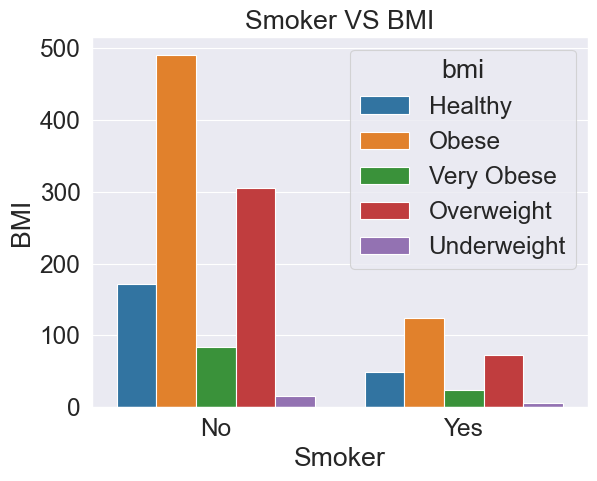

In [154]:
sns.countplot(x=df['smoker'], hue=cat_df['bmi'])
plt.xlabel('Smoker')
plt.ylabel('BMI')
plt.title('Smoker VS BMI')
plt.show()

## Catagorical and Numerical Columns

* Gender with BMI
* Gender with BloodPressure
* Gender with Claim
* Diabetic with BMI
* Diabetic with BloodPressure
* Diabetic with Claim
* Smoker with BMI
* Smoker with BloodPressure
* Smoker with Claim
* Region with BMI
* Region with BloodPressure
* Region with Claim
* BMI with Claim
* BloodPressure with Claim

In [156]:
sns.set_context('paper', font_scale = 2)

**Gender with BMI**

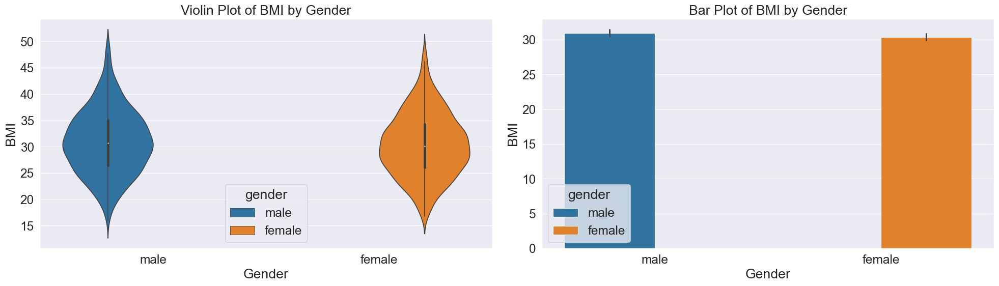

In [173]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='gender', y='bmi', ax=ax1, hue=df['gender'])
ax1.set_title('Violin Plot of BMI by Gender')
ax1.set_xlabel('Gender')
ax1.set_ylabel('BMI')
sns.barplot(data=df, x='gender', y='bmi', ax=ax2, hue=df['gender'])
ax2.set_title('Bar Plot of BMI by Gender')
ax2.set_xlabel('Gender')
ax2.set_ylabel('BMI')
plt.tight_layout()
plt.show()

**Gender with BloodPressure**

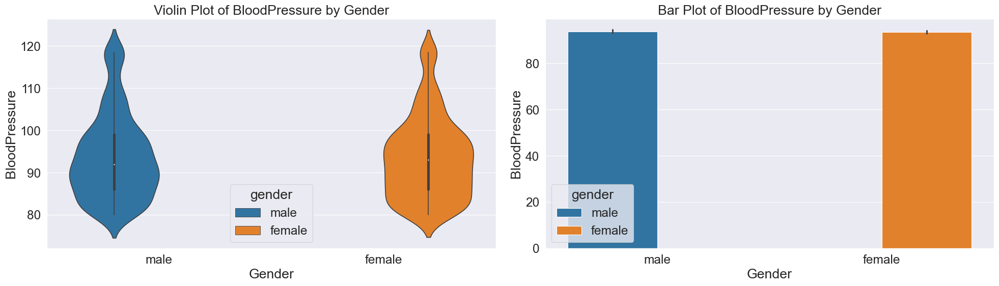

In [175]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='gender', y='bloodpressure', ax=ax1, hue=df['gender'])
ax1.set_title('Violin Plot of BloodPressure by Gender')
ax1.set_xlabel('Gender')
ax1.set_ylabel('BloodPressure')
sns.barplot(data=df, x='gender', y='bloodpressure', ax=ax2, hue=df['gender'])
ax2.set_title('Bar Plot of BloodPressure by Gender')
ax2.set_xlabel('Gender')
ax2.set_ylabel('BloodPressure')
plt.tight_layout()
plt.show()

**Gender with Claim**

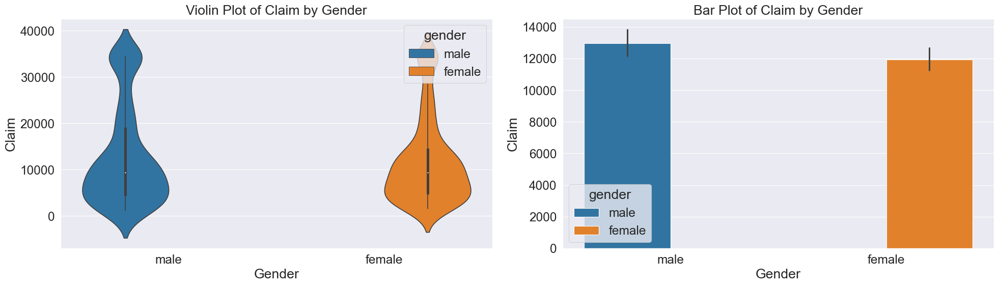

In [176]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='gender', y='claim', ax=ax1, hue=df['gender'])
ax1.set_title('Violin Plot of Claim by Gender')
ax1.set_xlabel('Gender')
ax1.set_ylabel('Claim')
sns.barplot(data=df, x='gender', y='claim', ax=ax2, hue=df['gender'])
ax2.set_title('Bar Plot of Claim by Gender')
ax2.set_xlabel('Gender')
ax2.set_ylabel('Claim')
plt.tight_layout()
plt.show()

**Diabetic with BMI**

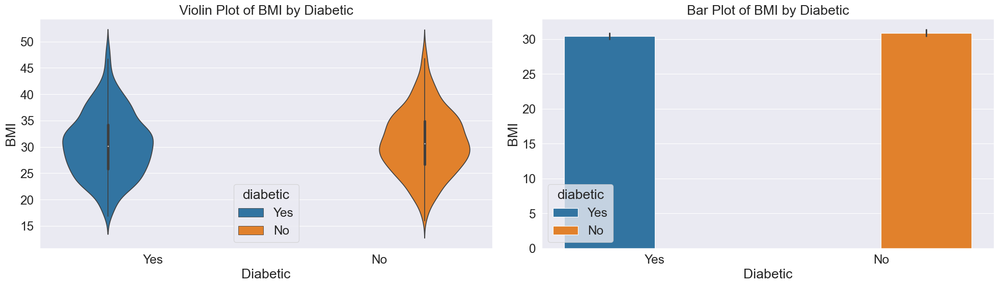

In [177]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='diabetic', y='bmi', ax=ax1, hue=df['diabetic'])
ax1.set_title('Violin Plot of BMI by Diabetic')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('BMI')
sns.barplot(data=df, x='diabetic', y='bmi', ax=ax2, hue=df['diabetic'])
ax2.set_title('Bar Plot of BMI by Diabetic')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('BMI')
plt.tight_layout()
plt.show()

**Diabetic with BloodPressure**

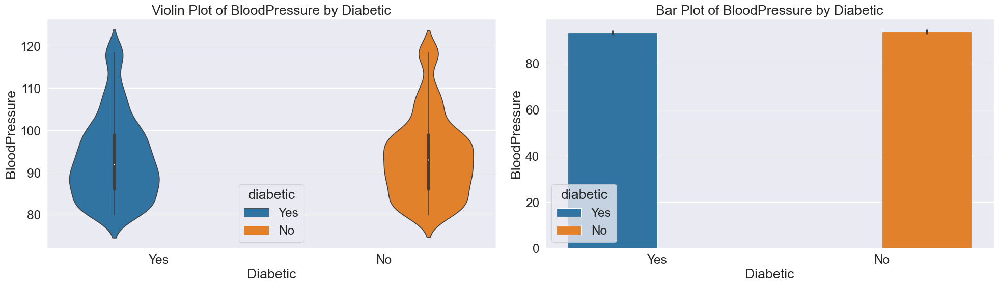

In [179]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='diabetic', y='bloodpressure', ax=ax1, hue=df['diabetic'])
ax1.set_title('Violin Plot of BloodPressure by Diabetic')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('BloodPressure')
sns.barplot(data=df, x='diabetic', y='bloodpressure', ax=ax2, hue=df['diabetic'])
ax2.set_title('Bar Plot of BloodPressure by Diabetic')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('BloodPressure')
plt.tight_layout()
plt.show()

**Diabetic with Claim**

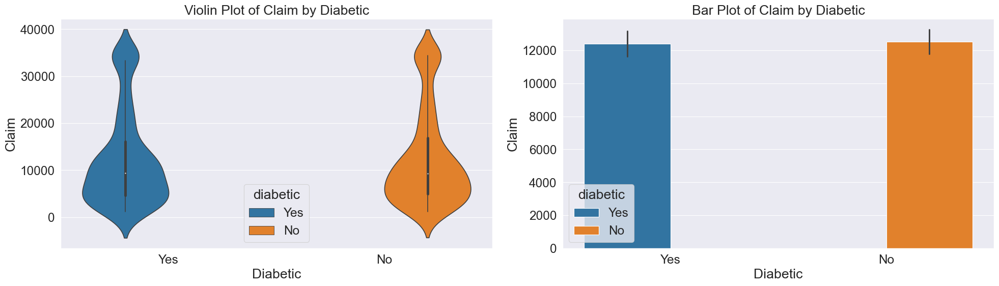

In [180]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='diabetic', y='claim', ax=ax1, hue=df['diabetic'])
ax1.set_title('Violin Plot of Claim by Diabetic')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('Claim')
sns.barplot(data=df, x='diabetic', y='claim', ax=ax2, hue=df['diabetic'])
ax2.set_title('Bar Plot of Claim by Diabetic')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('Claim')
plt.tight_layout()
plt.show()

**Smoker with BMI**

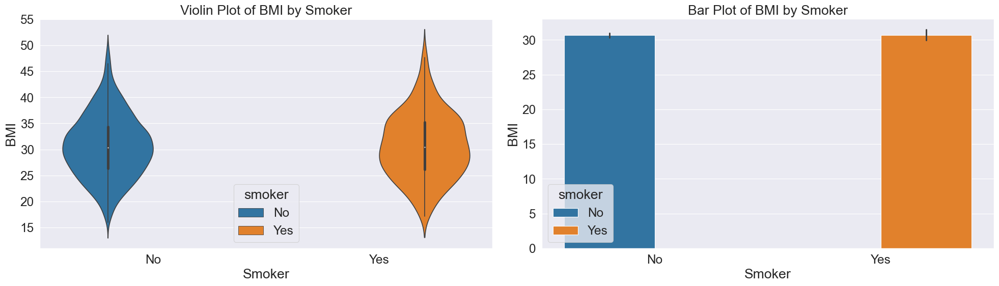

In [181]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='smoker', y='bmi', ax=ax1, hue=df['smoker'])
ax1.set_title('Violin Plot of BMI by Smoker')
ax1.set_xlabel('Smoker')
ax1.set_ylabel('BMI')
sns.barplot(data=df, x='smoker', y='bmi', ax=ax2, hue=df['smoker'])
ax2.set_title('Bar Plot of BMI by Smoker')
ax2.set_xlabel('Smoker')
ax2.set_ylabel('BMI')
plt.tight_layout()
plt.show()

**Smoker with BloodPressure**

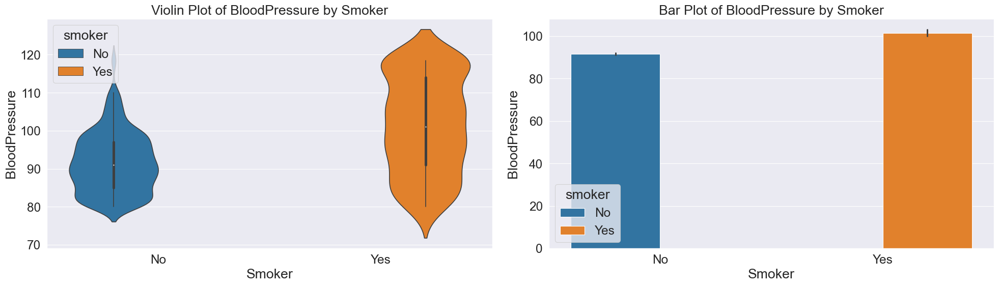

In [182]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='smoker', y='bloodpressure', ax=ax1, hue=df['smoker'])
ax1.set_title('Violin Plot of BloodPressure by Smoker')
ax1.set_xlabel('Smoker')
ax1.set_ylabel('BloodPressure')
sns.barplot(data=df, x='smoker', y='bloodpressure', ax=ax2, hue=df['smoker'])
ax2.set_title('Bar Plot of BloodPressure by Smoker')
ax2.set_xlabel('Smoker')
ax2.set_ylabel('BloodPressure')
plt.tight_layout()
plt.show()

**Smoker with Claim**

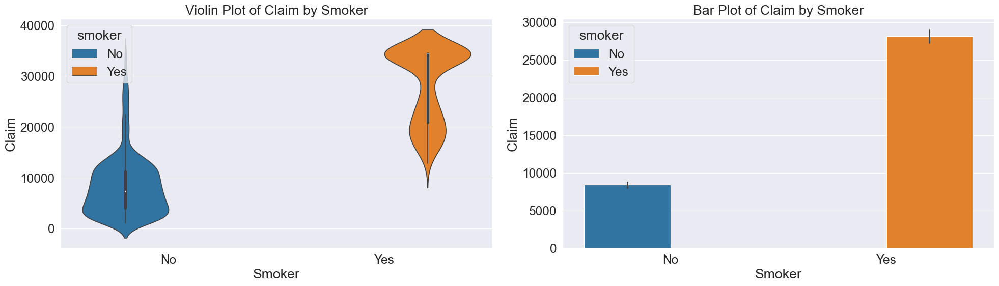

In [183]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='smoker', y='claim', ax=ax1, hue=df['smoker'])
ax1.set_title('Violin Plot of Claim by Smoker')
ax1.set_xlabel('Smoker')
ax1.set_ylabel('Claim')
sns.barplot(data=df, x='smoker', y='claim', ax=ax2, hue=df['smoker'])
ax2.set_title('Bar Plot of Claim by Smoker')
ax2.set_xlabel('Smoker')
ax2.set_ylabel('Claim')
plt.tight_layout()
plt.show()

**Region with BMI**

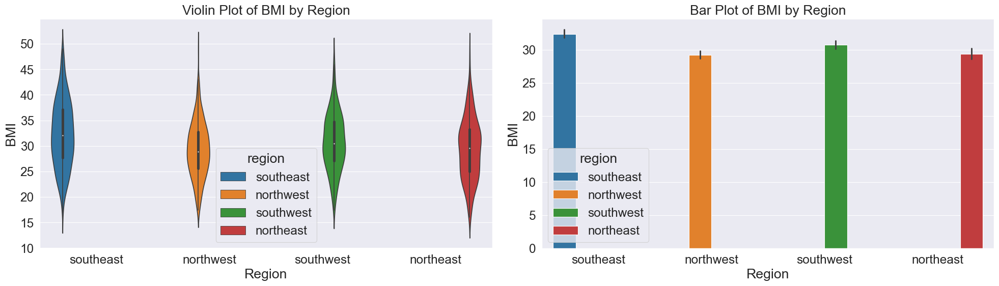

In [185]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='region', y='bmi', ax=ax1, hue=df['region'])
ax1.set_title('Violin Plot of BMI by Region')
ax1.set_xlabel('Region')
ax1.set_ylabel('BMI')
sns.barplot(data=df, x='region', y='bmi', ax=ax2, hue=df['region'])
ax2.set_title('Bar Plot of BMI by Region')
ax2.set_xlabel('Region')
ax2.set_ylabel('BMI')
plt.tight_layout()
plt.show()

**Region with BloodPressure**

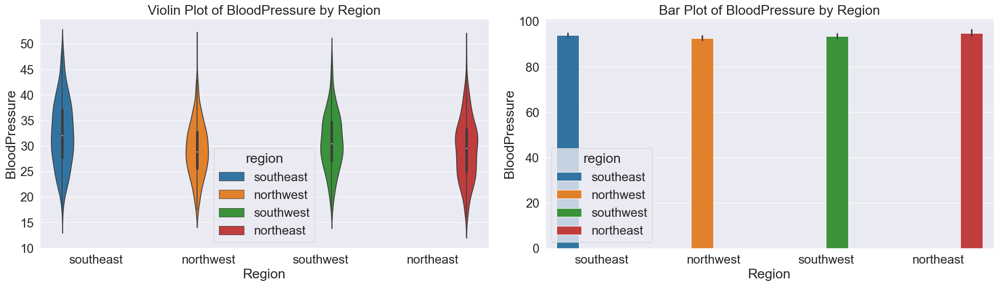

In [187]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='region', y='bmi', ax=ax1, hue=df['region'])
ax1.set_title('Violin Plot of BloodPressure by Region')
ax1.set_xlabel('Region')
ax1.set_ylabel('BloodPressure')
sns.barplot(data=df, x='region', y='bloodpressure', ax=ax2, hue=df['region'])
ax2.set_title('Bar Plot of BloodPressure by Region')
ax2.set_xlabel('Region')
ax2.set_ylabel('BloodPressure')
plt.tight_layout()
plt.show()

**Region with Claim**

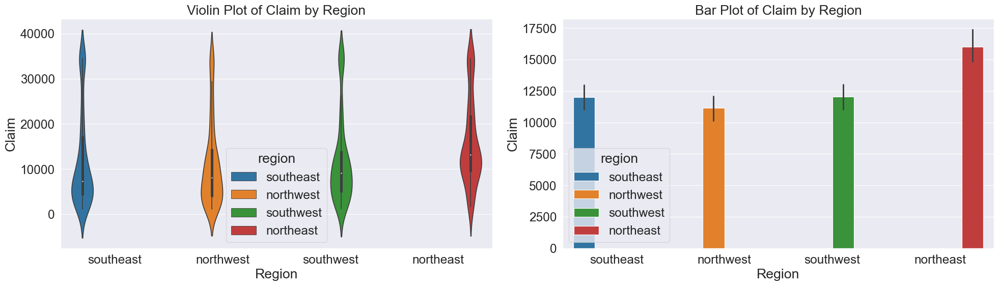

In [188]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(data=df, x='region', y='claim', ax=ax1, hue=df['region'])
ax1.set_title('Violin Plot of Claim by Region')
ax1.set_xlabel('Region')
ax1.set_ylabel('Claim')
sns.barplot(data=df, x='region', y='claim', ax=ax2, hue=df['region'])
ax2.set_title('Bar Plot of Claim by Region')
ax2.set_xlabel('Region')
ax2.set_ylabel('Claim')
plt.tight_layout()
plt.show()

**BMI with Claim**

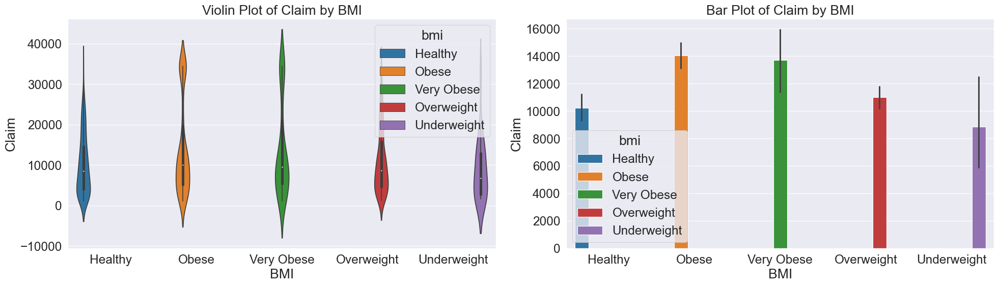

In [191]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(x=cat_df['bmi'], y=df['claim'], ax=ax1, hue=cat_df['bmi'])
ax1.set_title('Violin Plot of Claim by BMI')
ax1.set_xlabel('BMI')
ax1.set_ylabel('Claim')
sns.barplot(x=cat_df['bmi'], y=df['claim'], ax=ax2, hue=cat_df['bmi'])
ax2.set_title('Bar Plot of Claim by BMI')
ax2.set_xlabel('BMI')
ax2.set_ylabel('Claim')
plt.tight_layout()
plt.show()

**BloodPressure with Claim**

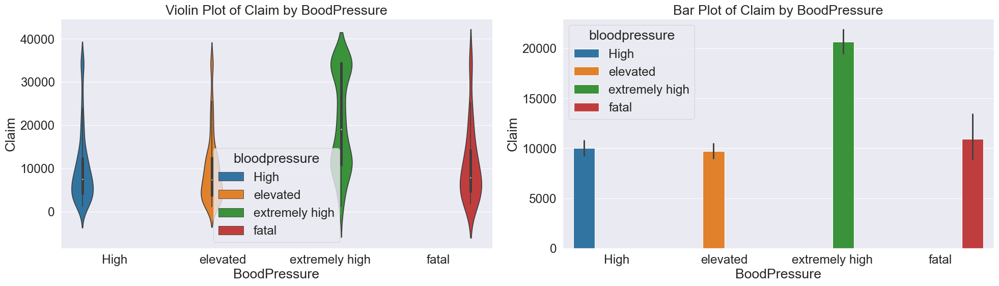

In [192]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)
sns.violinplot(x=cat_df['bloodpressure'], y=df['claim'], ax=ax1, hue=cat_df['bloodpressure'])
ax1.set_title('Violin Plot of Claim by BoodPressure')
ax1.set_xlabel('BoodPressure')
ax1.set_ylabel('Claim')
sns.barplot(x=cat_df['bloodpressure'], y=df['claim'], ax=ax2, hue=cat_df['bloodpressure'])
ax2.set_title('Bar Plot of Claim by BoodPressure')
ax2.set_xlabel('BoodPressure')
ax2.set_ylabel('Claim')
plt.tight_layout()
plt.show()

## Numerical to Numerical

* Age with BMI
* Age with BloodPressure
* BMI with BloodPressure
* Age with Claim
* BMI with Claim
* BloodPressure with Claim

**Age with BMI ---V/S--- Age with BloodPressure ---V/S--- BMI with BloodPressure**

Text(0.5, 1.0, 'BloodPressure VS BMI')

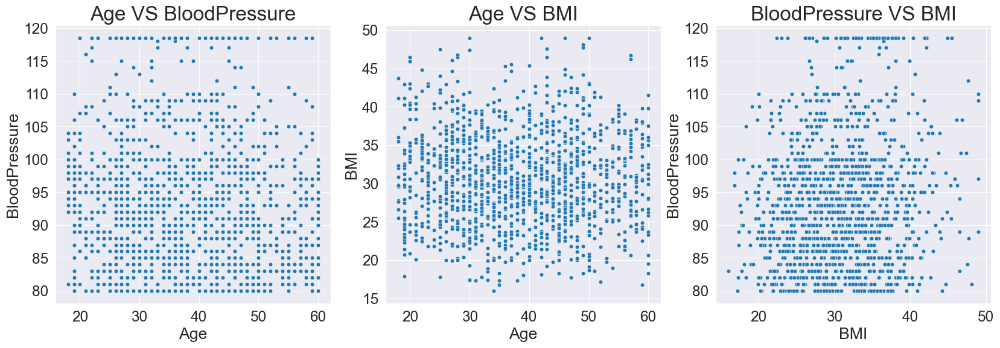

In [200]:
fig = plt.figure(figsize=(20,6))
(ax1,ax2,ax3) = fig.subplots(1,3)
sns.scatterplot(x=df['age'],y=df['bmi'],ax=ax2);
ax2.set_xlabel('Age')
ax2.set_ylabel('BMI')
ax2.set_title('Age VS BMI', fontsize=24, loc='center')

sns.scatterplot(x=df['age'],y=df['bloodpressure'],ax=ax1);
ax1.set_xlabel('Age')
ax1.set_ylabel('BloodPressure')
ax1.set_title('Age VS BloodPressure', fontsize=24, loc='center')

sns.scatterplot(x=df['bmi'],y=df['bloodpressure']);
ax3.set_xlabel('BMI')
ax3.set_ylabel('BloodPressure')
ax3.set_title('BloodPressure VS BMI', fontsize=24, loc='center')

**Age with Claim ---V/S--- BMI with Claim ---V/S--- BloodPressure with Claim**

Text(0.5, 1.0, 'BloodPressure VS Claim')

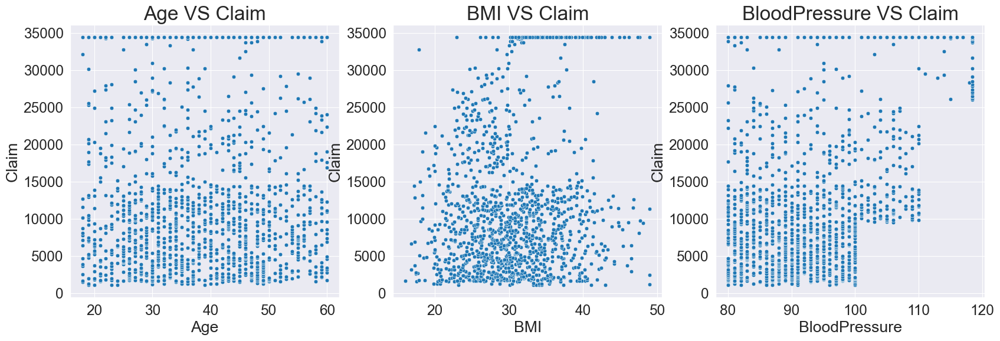

In [202]:
fig = plt.figure(figsize=(20,6))
(ax1,ax2,ax3) = fig.subplots(1,3)
sns.scatterplot(x=df['age'],y=df['claim'],ax=ax1)
ax1.set_xlabel('Age')
ax1.set_ylabel('Claim')
ax1.set_title('Age VS Claim', fontsize=24, loc='center');

sns.scatterplot(x=df['bmi'],y=df['claim'],ax=ax2);
ax2.set_xlabel('BMI')
ax2.set_ylabel('Claim')
ax2.set_title('BMI VS Claim', fontsize=24, loc='center');

sns.scatterplot(x=df['bloodpressure'],y=df['claim'],ax=ax3);
ax3.set_xlabel('BloodPressure')
ax3.set_ylabel('Claim')
ax3.set_title('BloodPressure VS Claim', fontsize=24, loc='center')

In [203]:
df[num_cols].corr()

,age,bmi,bloodpressure,children,claim
age,1.000000,-0.042350,-0.071450,-0.025547,-0.029839
bmi,-0.042350,1.000000,0.141027,0.012655,0.159282
bloodpressure,-0.071450,0.141027,1.000000,-0.029573,0.507597
children,-0.025547,0.012655,-0.029573,1.000000,0.074492
claim,-0.029839,0.159282,0.507597,0.074492,1.000000


<Axes: >

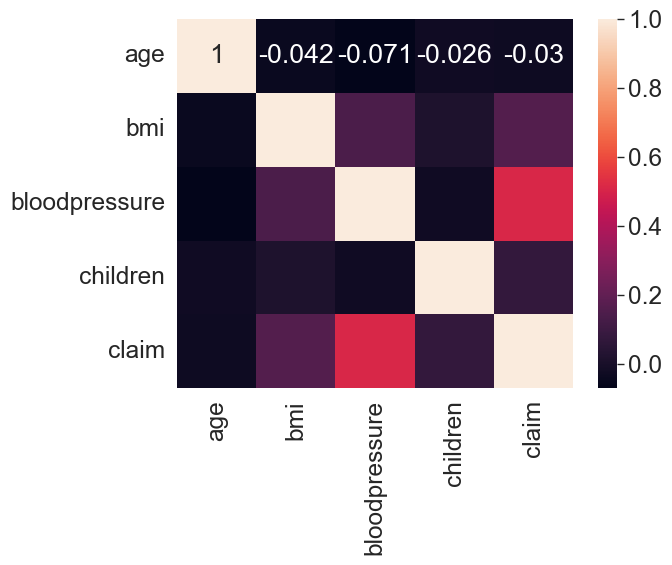

In [204]:
sns.heatmap(df[num_cols].corr(), annot=True)

## Multivariate Data Anaysis

#### Categorical to Categorical

* Gender v/s BMI v/s Smoker
* Gender v/s BMI v/s Diabetic
* Gender v/s BMI v/s Region
* Gender v/s BMI v/s Children
* Gender v/s BloodPressure v/s Smoker
* Gender v/s BloodPressure v/s Diabetic
* Gender v/s BloodPressure v/s Region
* Gender v/s BloodPressure v/s Children
* Gender v/s Claim v/s Smoker
* Gender v/s Claim v/s Diabetic
* Gender v/s Claim v/s Region
* Gender v/s Claim v/s Children
* Diabetic v/s BloodPressure v/s Smoker
* Diabetic v/s BloodPressure v/s Children
* Diabetic v/s BloodPressure v/s Region
* Diabetic v/s BMI v/s Smoker
* Diabetic v/s BMI v/s Children
* Diabetic v/s BMI v/s Region
* Diabetic v/s BMI v/s BloodPressure
* Diabetic v/s Claim v/s Smoker
* Diabetic v/s Claim v/s Children
* Diabetic v/s Claim v/s Region
* Categorical BloodPressure v/s BMI v/s Smoker
* Categorical BloodPressure v/s BMI v/s Diabetics
* Categorical BloodPressure v/s BMI v/s Region
* Categorical BloodPressure v/s BMI v/s Children
* Categorical BloodPressure v/s Claim v/s Smoker
* Categorical BloodPressure v/s Claim v/s Diabetic
* Categorical BloodPressure v/s Claim v/s Region
* Categorical BloodPressure v/s Claim v/s Children

**Gender v/s BMI v/s Smoker**dPressure v/s Claim v/s Children

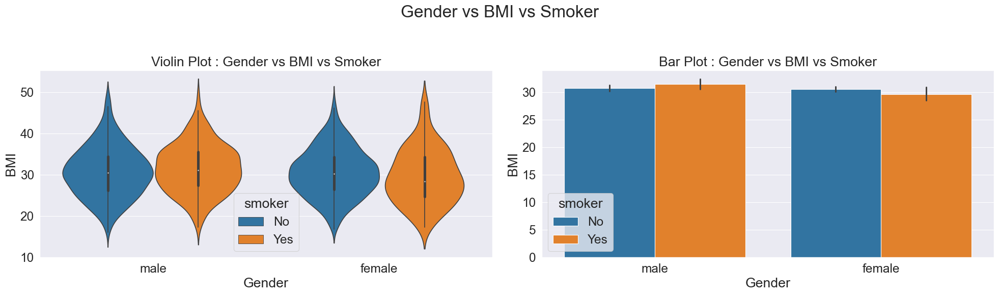

In [214]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['bmi'], hue=df['smoker'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs BMI vs Smoker')
ax1.set_xlabel('Gender')
ax1.set_ylabel('BMI')

sns.barplot(x=df['gender'], y=df['bmi'], hue=df['smoker'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs BMI vs Smoker')
ax2.set_xlabel('Gender')
ax2.set_ylabel('BMI')

plt.suptitle('Gender vs BMI vs Smoker', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s BMI v/s Diabetic**

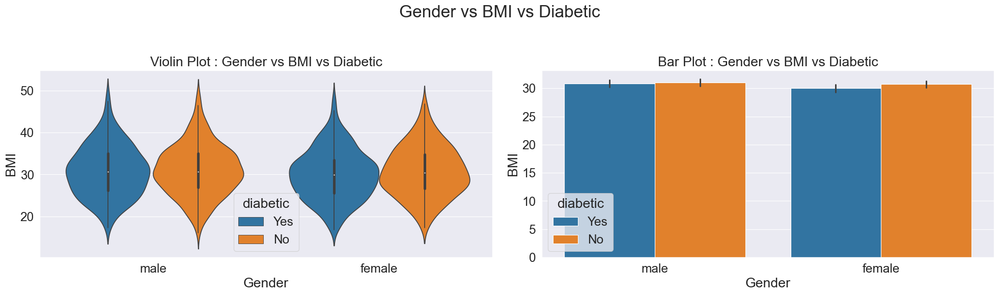

In [215]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['bmi'], hue=df['diabetic'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs BMI vs Diabetic')
ax1.set_xlabel('Gender')
ax1.set_ylabel('BMI')

sns.barplot(x=df['gender'], y=df['bmi'], hue=df['diabetic'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs BMI vs Diabetic')
ax2.set_xlabel('Gender')
ax2.set_ylabel('BMI')

plt.suptitle('Gender vs BMI vs Diabetic', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s BMI v/s Region**

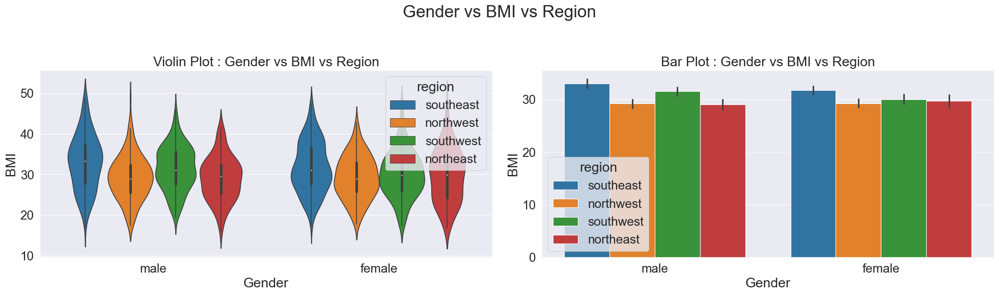

In [216]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['bmi'], hue=df['region'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs BMI vs Region')
ax1.set_xlabel('Gender')
ax1.set_ylabel('BMI')

sns.barplot(x=df['gender'], y=df['bmi'], hue=df['region'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs BMI vs Region')
ax2.set_xlabel('Gender')
ax2.set_ylabel('BMI')

plt.suptitle('Gender vs BMI vs Region', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s BMI v/s Children**

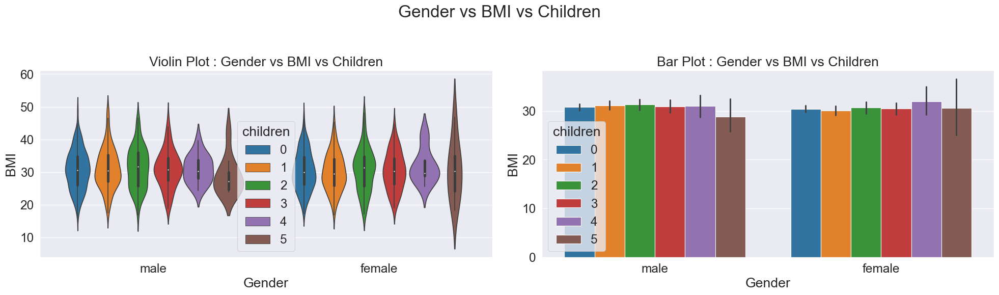

In [217]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['bmi'], hue=df['children'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs BMI vs Children')
ax1.set_xlabel('Gender')
ax1.set_ylabel('BMI')

sns.barplot(x=df['gender'], y=df['bmi'], hue=df['children'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs BMI vs Children')
ax2.set_xlabel('Gender')
ax2.set_ylabel('BMI')

plt.suptitle('Gender vs BMI vs Children', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s BloodPressure v/s Smoker**

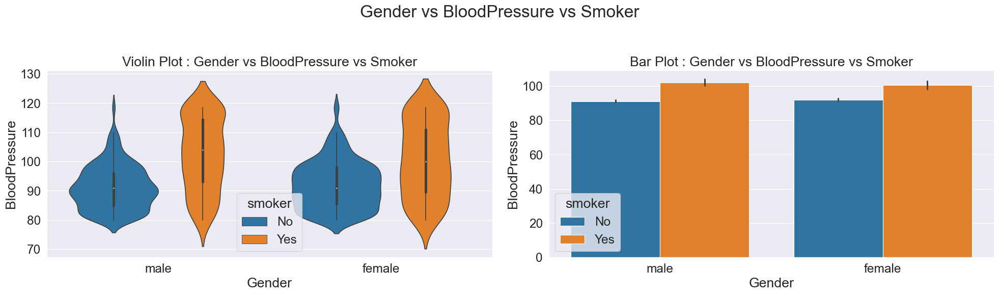

In [218]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['bloodpressure'], hue=df['smoker'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs BloodPressure vs Smoker')
ax1.set_xlabel('Gender')
ax1.set_ylabel('BloodPressure')

sns.barplot(x=df['gender'], y=df['bloodpressure'], hue=df['smoker'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs BloodPressure vs Smoker')
ax2.set_xlabel('Gender')
ax2.set_ylabel('BloodPressure')

plt.suptitle('Gender vs BloodPressure vs Smoker', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s BloodPressure v/s Diabetic**

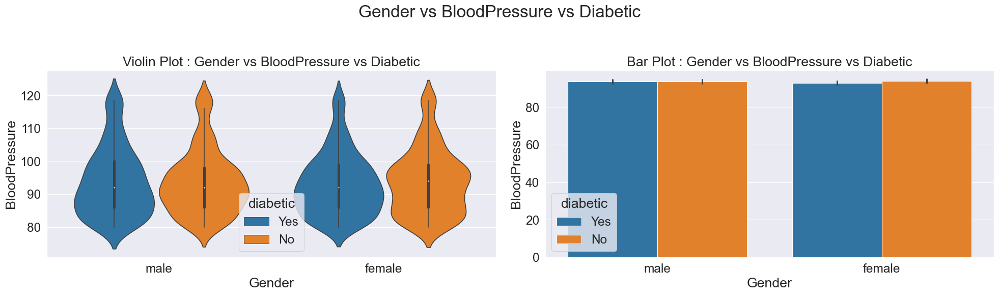

In [219]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['bloodpressure'], hue=df['diabetic'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs BloodPressure vs Diabetic')
ax1.set_xlabel('Gender')
ax1.set_ylabel('BloodPressure')

sns.barplot(x=df['gender'], y=df['bloodpressure'], hue=df['diabetic'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs BloodPressure vs Diabetic')
ax2.set_xlabel('Gender')
ax2.set_ylabel('BloodPressure')

plt.suptitle('Gender vs BloodPressure vs Diabetic', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s BloodPressure v/s Region**

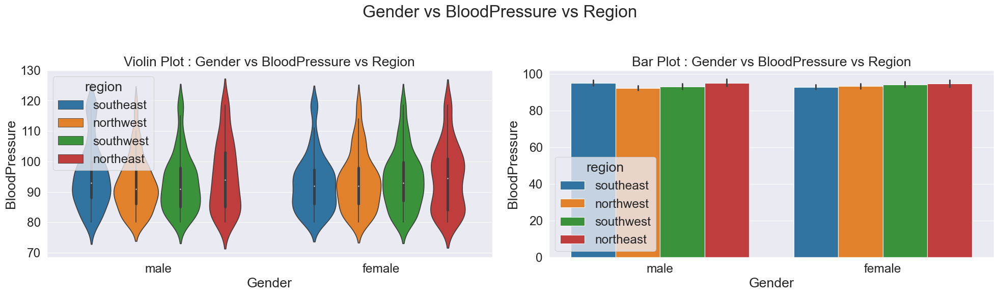

In [220]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['bloodpressure'], hue=df['region'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs BloodPressure vs Region')
ax1.set_xlabel('Gender')
ax1.set_ylabel('BloodPressure')

sns.barplot(x=df['gender'], y=df['bloodpressure'], hue=df['region'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs BloodPressure vs Region')
ax2.set_xlabel('Gender')
ax2.set_ylabel('BloodPressure')

plt.suptitle('Gender vs BloodPressure vs Region', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s BloodPressure v/s Children**

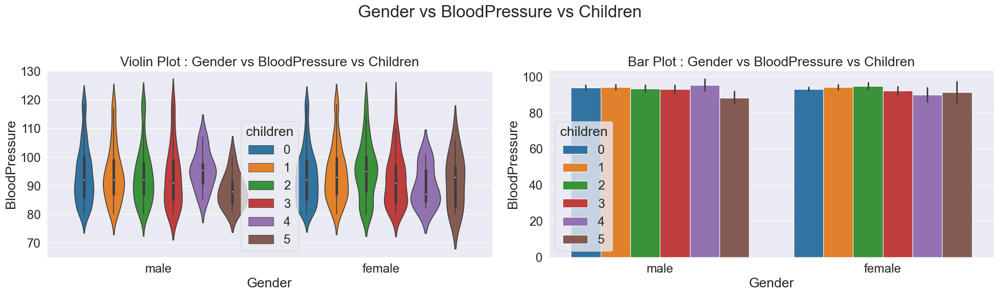

In [221]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['bloodpressure'], hue=df['children'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs BloodPressure vs Children')
ax1.set_xlabel('Gender')
ax1.set_ylabel('BloodPressure')

sns.barplot(x=df['gender'], y=df['bloodpressure'], hue=df['children'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs BloodPressure vs Children')
ax2.set_xlabel('Gender')
ax2.set_ylabel('BloodPressure')

plt.suptitle('Gender vs BloodPressure vs Children', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s Claim v/s Smoker**

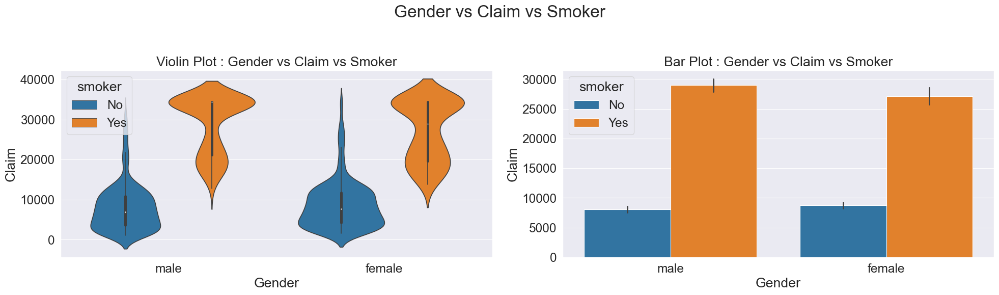

In [222]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['claim'], hue=df['smoker'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs Claim vs Smoker')
ax1.set_xlabel('Gender')
ax1.set_ylabel('Claim')

sns.barplot(x=df['gender'], y=df['claim'], hue=df['smoker'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs Claim vs Smoker')
ax2.set_xlabel('Gender')
ax2.set_ylabel('Claim')

plt.suptitle('Gender vs Claim vs Smoker', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s Claim v/s Diabetic**

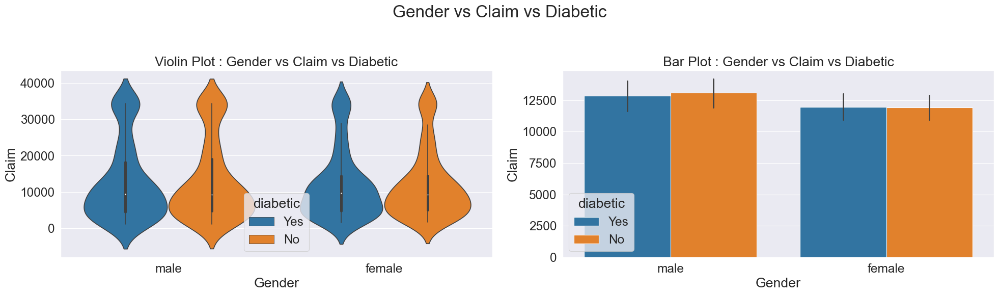

In [223]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['claim'], hue=df['diabetic'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs Claim vs Diabetic')
ax1.set_xlabel('Gender')
ax1.set_ylabel('Claim')

sns.barplot(x=df['gender'], y=df['claim'], hue=df['diabetic'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs Claim vs Diabetic')
ax2.set_xlabel('Gender')
ax2.set_ylabel('Claim')

plt.suptitle('Gender vs Claim vs Diabetic', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s Claim v/s Region**

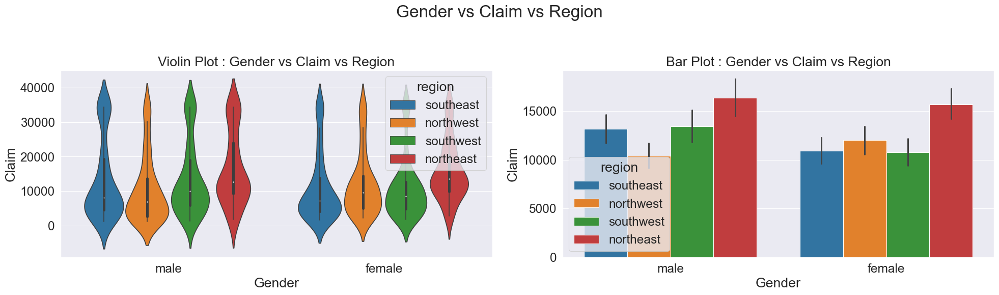

In [224]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['claim'], hue=df['region'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs Claim vs Region')
ax1.set_xlabel('Gender')
ax1.set_ylabel('Claim')

sns.barplot(x=df['gender'], y=df['claim'], hue=df['region'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs Claim vs Region')
ax2.set_xlabel('Gender')
ax2.set_ylabel('Claim')

plt.suptitle('Gender vs Claim vs Region', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Gender v/s Claim v/s Children**

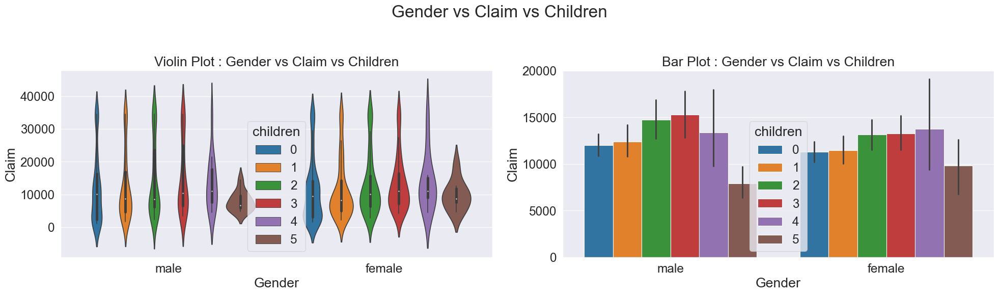

In [225]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['gender'], y=df['claim'], hue=df['children'], ax=ax1)
ax1.set_title('Violin Plot : Gender vs Claim vs Children')
ax1.set_xlabel('Gender')
ax1.set_ylabel('Claim')

sns.barplot(x=df['gender'], y=df['claim'], hue=df['children'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs Claim vs Children')
ax2.set_xlabel('Gender')
ax2.set_ylabel('Claim')

plt.suptitle('Gender vs Claim vs Children', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Diabetic v/s BloodPressure v/s Smoker**

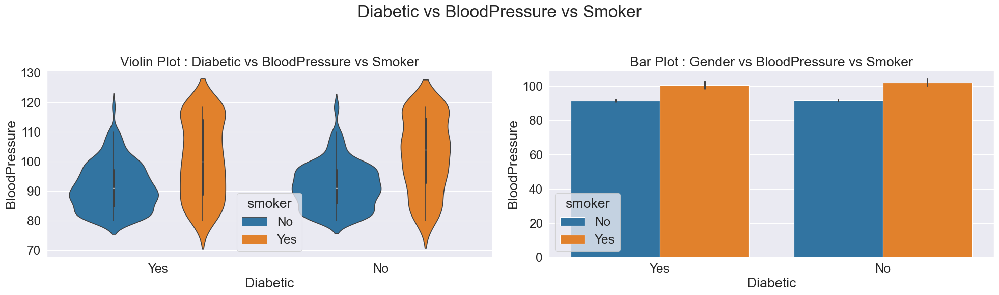

In [229]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['diabetic'], y=df['bloodpressure'], hue=df['smoker'], ax=ax1)
ax1.set_title('Violin Plot : Diabetic vs BloodPressure vs Smoker')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('BloodPressure')

sns.barplot(x=df['diabetic'], y=df['bloodpressure'], hue=df['smoker'], ax=ax2)
ax2.set_title('Bar Plot : Gender vs BloodPressure vs Smoker')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('BloodPressure')

plt.suptitle('Diabetic vs BloodPressure vs Smoker', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Diabetic v/s BloodPressure v/s Children**

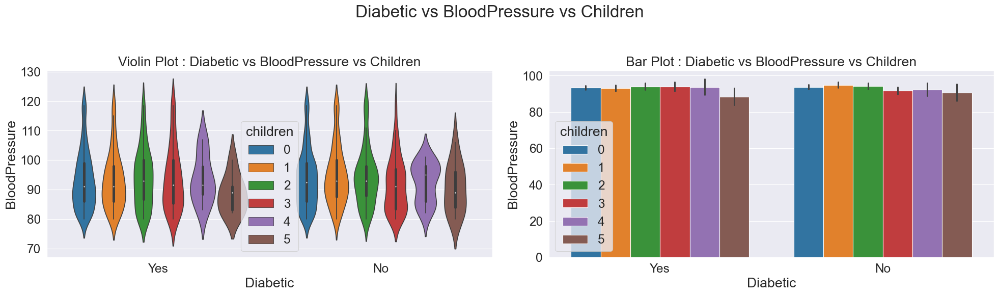

In [230]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['diabetic'], y=df['bloodpressure'], hue=df['children'], ax=ax1)
ax1.set_title('Violin Plot : Diabetic vs BloodPressure vs Children')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('BloodPressure')

sns.barplot(x=df['diabetic'], y=df['bloodpressure'], hue=df['children'], ax=ax2)
ax2.set_title('Bar Plot : Diabetic vs BloodPressure vs Children')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('BloodPressure')

plt.suptitle('Diabetic vs BloodPressure vs Children', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Diabetic v/s BloodPressure v/s Region**

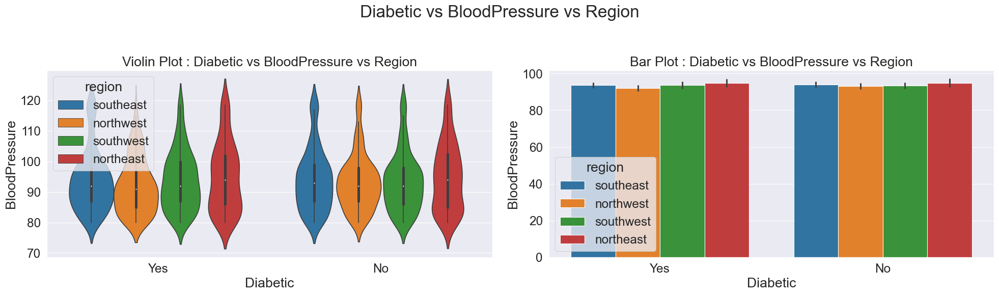

In [231]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['diabetic'], y=df['bloodpressure'], hue=df['region'], ax=ax1)
ax1.set_title('Violin Plot : Diabetic vs BloodPressure vs Region')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('BloodPressure')

sns.barplot(x=df['diabetic'], y=df['bloodpressure'], hue=df['region'], ax=ax2)
ax2.set_title('Bar Plot : Diabetic vs BloodPressure vs Region')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('BloodPressure')

plt.suptitle('Diabetic vs BloodPressure vs Region', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Diabetic v/s BMI v/s Smoker**

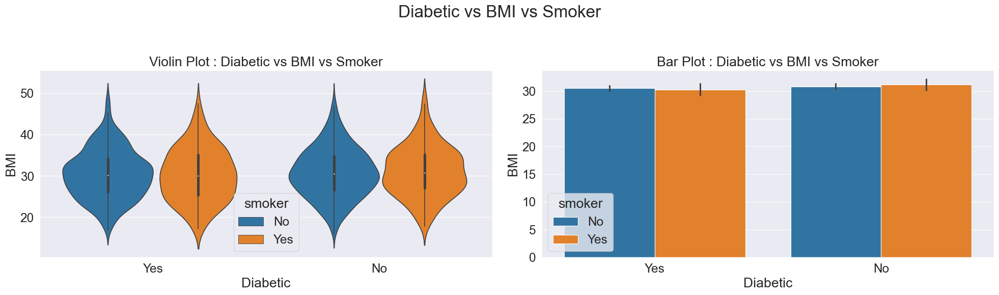

In [232]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['diabetic'], y=df['bmi'], hue=df['smoker'], ax=ax1)
ax1.set_title('Violin Plot : Diabetic vs BMI vs Smoker')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('BMI')

sns.barplot(x=df['diabetic'], y=df['bmi'], hue=df['smoker'], ax=ax2)
ax2.set_title('Bar Plot : Diabetic vs BMI vs Smoker')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('BMI')

plt.suptitle('Diabetic vs BMI vs Smoker', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Diabetic v/s BMI v/s Children**

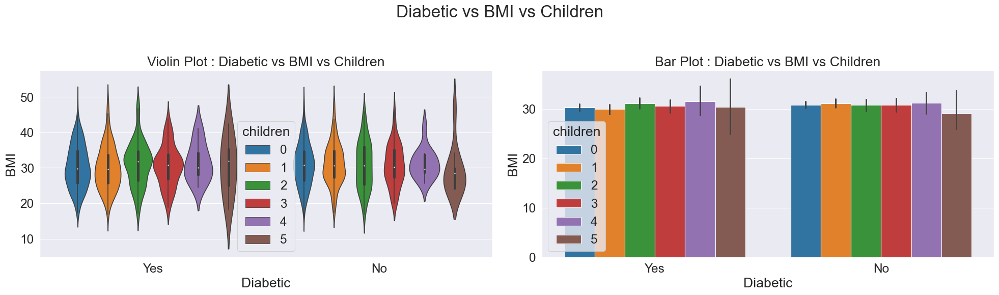

In [233]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['diabetic'], y=df['bmi'], hue=df['children'], ax=ax1)
ax1.set_title('Violin Plot : Diabetic vs BMI vs Children')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('BMI')

sns.barplot(x=df['diabetic'], y=df['bmi'], hue=df['children'], ax=ax2)
ax2.set_title('Bar Plot : Diabetic vs BMI vs Children')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('BMI')

plt.suptitle('Diabetic vs BMI vs Children', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Diabetic v/s BMI v/s Region**

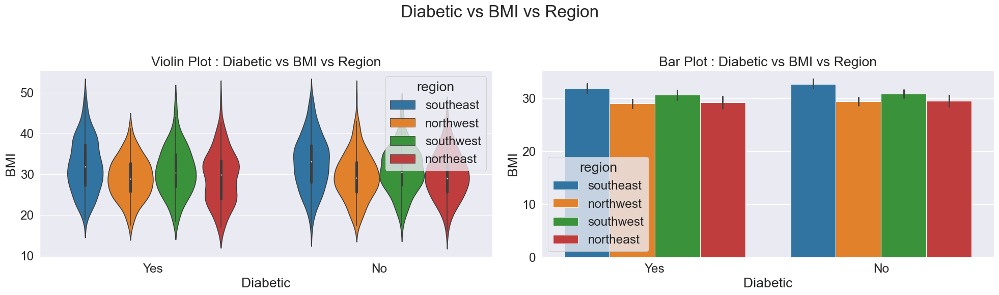

In [234]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['diabetic'], y=df['bmi'], hue=df['region'], ax=ax1)
ax1.set_title('Violin Plot : Diabetic vs BMI vs Region')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('BMI')

sns.barplot(x=df['diabetic'], y=df['bmi'], hue=df['region'], ax=ax2)
ax2.set_title('Bar Plot : Diabetic vs BMI vs Region')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('BMI')

plt.suptitle('Diabetic vs BMI vs Region', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Diabetic v/s BMI v/s BloodPressure**

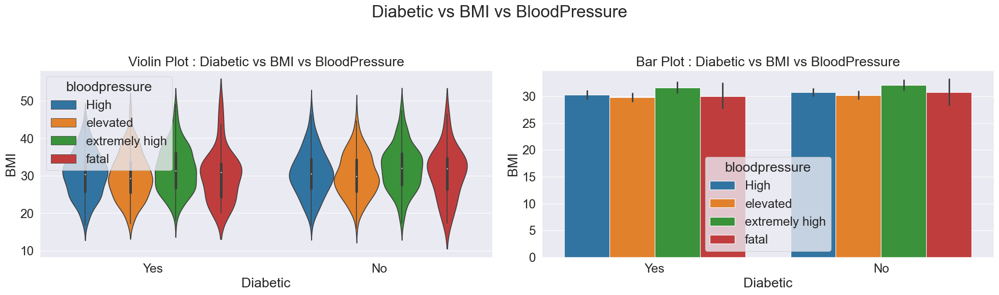

In [236]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['diabetic'], y=df['bmi'], hue=cat_df['bloodpressure'], ax=ax1)
ax1.set_title('Violin Plot : Diabetic vs BMI vs BloodPressure')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('BMI')

sns.barplot(x=df['diabetic'], y=df['bmi'], hue=catdf['bloodpressure'], ax=ax2)
ax2.set_title('Bar Plot : Diabetic vs BMI vs BloodPressure')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('BMI')

plt.suptitle('Diabetic vs BMI vs BloodPressure', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Diabetic v/s Claim v/s Smoker**

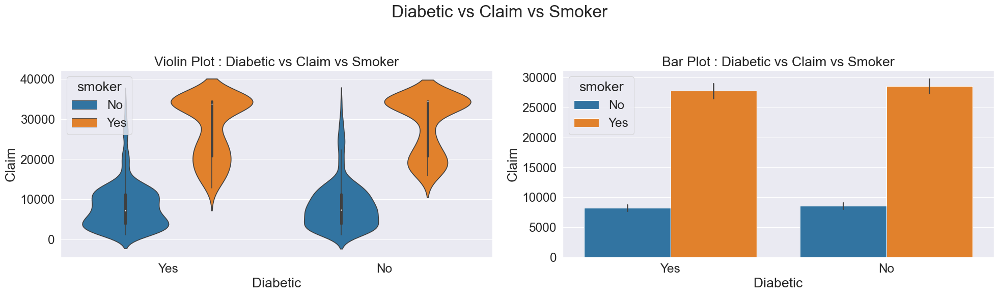

In [239]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['diabetic'], y=df['claim'], hue=df['smoker'], ax=ax1)
ax1.set_title('Violin Plot : Diabetic vs Claim vs Smoker')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('Claim')

sns.barplot(x=df['diabetic'], y=df['claim'], hue=df['smoker'], ax=ax2)
ax2.set_title('Bar Plot : Diabetic vs Claim vs Smoker')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('Claim')

plt.suptitle('Diabetic vs Claim vs Smoker', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Diabetic v/s Claim v/s Children**

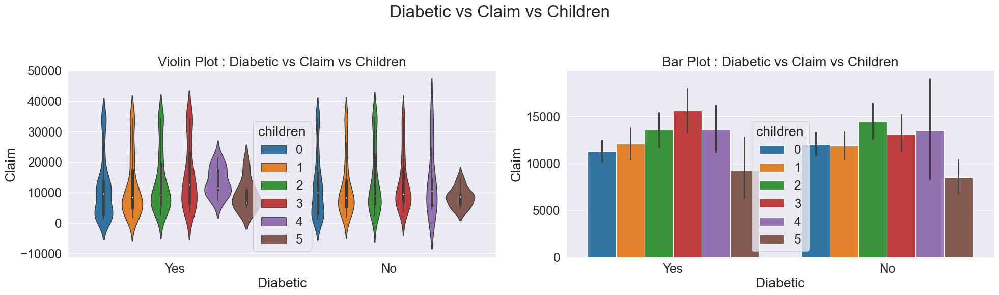

In [240]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['diabetic'], y=df['claim'], hue=df['children'], ax=ax1)
ax1.set_title('Violin Plot : Diabetic vs Claim vs Children')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('Claim')

sns.barplot(x=df['diabetic'], y=df['claim'], hue=df['children'], ax=ax2)
ax2.set_title('Bar Plot : Diabetic vs Claim vs Children')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('Claim')

plt.suptitle('Diabetic vs Claim vs Children', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Diabetic v/s Claim v/s Region**

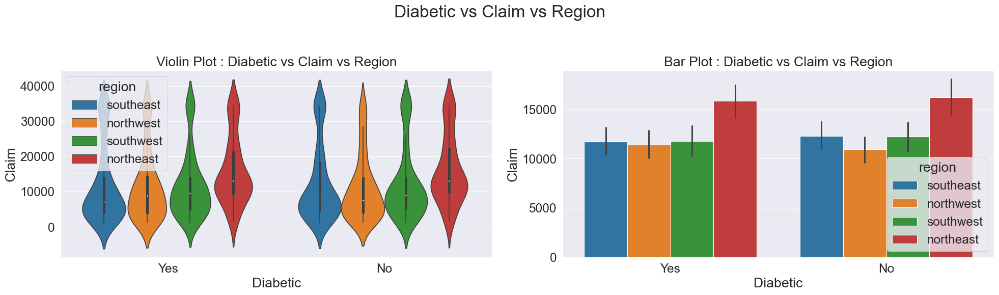

In [241]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=df['diabetic'], y=df['claim'], hue=df['region'], ax=ax1)
ax1.set_title('Violin Plot : Diabetic vs Claim vs Region')
ax1.set_xlabel('Diabetic')
ax1.set_ylabel('Claim')

sns.barplot(x=df['diabetic'], y=df['claim'], hue=df['region'], ax=ax2)
ax2.set_title('Bar Plot : Diabetic vs Claim vs Region')
ax2.set_xlabel('Diabetic')
ax2.set_ylabel('Claim')

plt.suptitle('Diabetic vs Claim vs Region', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Categorical BloodPressure v/s BMI v/s Smoker**

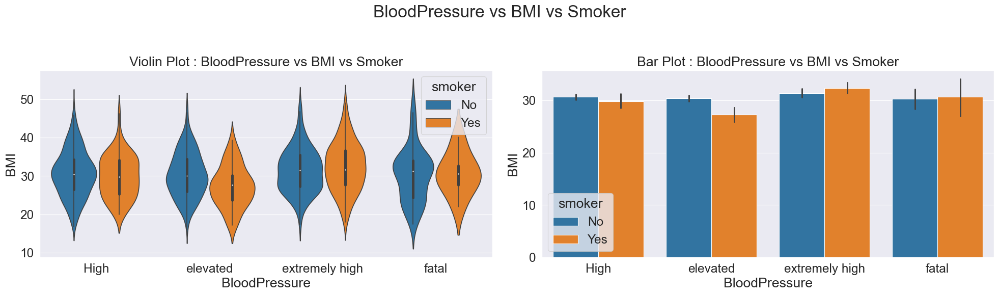

In [242]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=cat_df['bloodpressure'], y=df['bmi'], hue=df['smoker'], ax=ax1)
ax1.set_title('Violin Plot : BloodPressure vs BMI vs Smoker')
ax1.set_xlabel('BloodPressure')
ax1.set_ylabel('BMI')

sns.barplot(x=cat_df['bloodpressure'], y=df['bmi'], hue=df['smoker'], ax=ax2)
ax2.set_title('Bar Plot : BloodPressure vs BMI vs Smoker')
ax2.set_xlabel('BloodPressure')
ax2.set_ylabel('BMI')

plt.suptitle('BloodPressure vs BMI vs Smoker', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Categorical BloodPressure v/s BMI v/s Diabetics**

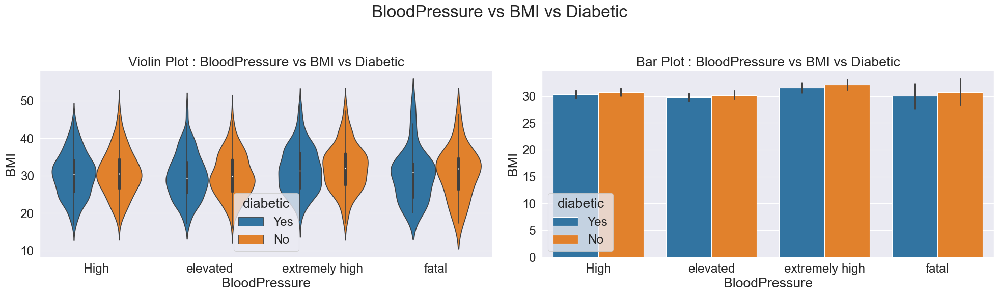

In [243]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=cat_df['bloodpressure'], y=df['bmi'], hue=df['diabetic'], ax=ax1)
ax1.set_title('Violin Plot : BloodPressure vs BMI vs Diabetic')
ax1.set_xlabel('BloodPressure')
ax1.set_ylabel('BMI')

sns.barplot(x=cat_df['bloodpressure'], y=df['bmi'], hue=df['diabetic'], ax=ax2)
ax2.set_title('Bar Plot : BloodPressure vs BMI vs Diabetic')
ax2.set_xlabel('BloodPressure')
ax2.set_ylabel('BMI')

plt.suptitle('BloodPressure vs BMI vs Diabetic', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Categorical BloodPressure v/s BMI v/s Region**

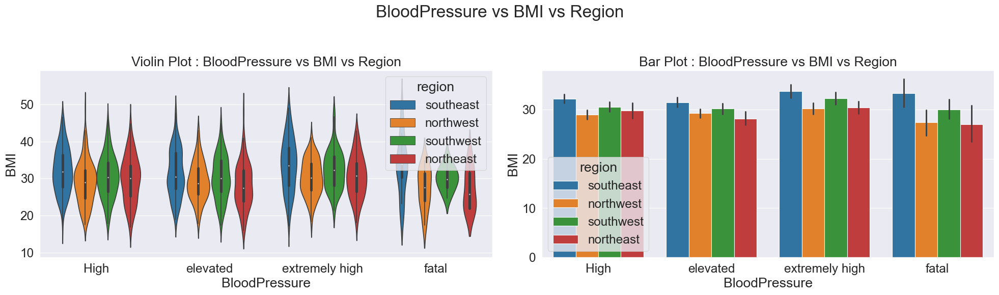

In [244]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=cat_df['bloodpressure'], y=df['bmi'], hue=df['region'], ax=ax1)
ax1.set_title('Violin Plot : BloodPressure vs BMI vs Region')
ax1.set_xlabel('BloodPressure')
ax1.set_ylabel('BMI')

sns.barplot(x=cat_df['bloodpressure'], y=df['bmi'], hue=df['region'], ax=ax2)
ax2.set_title('Bar Plot : BloodPressure vs BMI vs Region')
ax2.set_xlabel('BloodPressure')
ax2.set_ylabel('BMI')

plt.suptitle('BloodPressure vs BMI vs Region', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Categorical BloodPressure v/s BMI v/s Children**

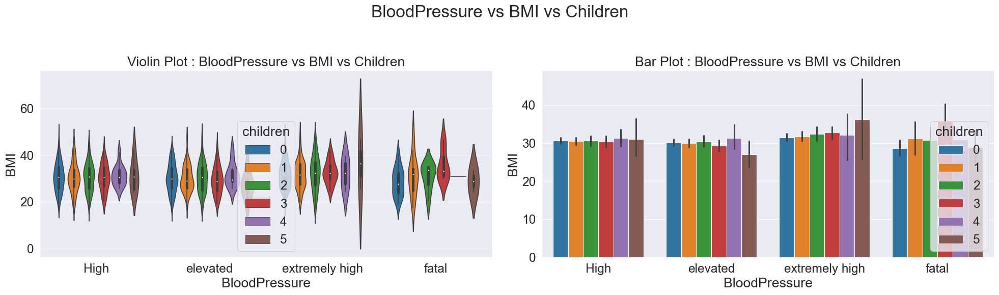

In [245]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=cat_df['bloodpressure'], y=df['bmi'], hue=df['children'], ax=ax1)
ax1.set_title('Violin Plot : BloodPressure vs BMI vs Children')
ax1.set_xlabel('BloodPressure')
ax1.set_ylabel('BMI')

sns.barplot(x=cat_df['bloodpressure'], y=df['bmi'], hue=df['children'], ax=ax2)
ax2.set_title('Bar Plot : BloodPressure vs BMI vs Children')
ax2.set_xlabel('BloodPressure')
ax2.set_ylabel('BMI')

plt.suptitle('BloodPressure vs BMI vs Children', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Categorical BloodPressure v/s Claim v/s Smoker**

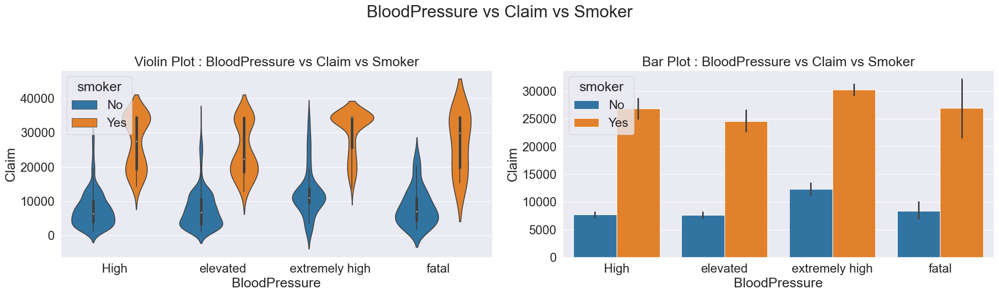

In [246]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=cat_df['bloodpressure'], y=df['claim'], hue=df['smoker'], ax=ax1)
ax1.set_title('Violin Plot : BloodPressure vs Claim vs Smoker')
ax1.set_xlabel('BloodPressure')
ax1.set_ylabel('Claim')

sns.barplot(x=cat_df['bloodpressure'], y=df['claim'], hue=df['smoker'], ax=ax2)
ax2.set_title('Bar Plot : BloodPressure vs Claim vs Smoker')
ax2.set_xlabel('BloodPressure')
ax2.set_ylabel('Claim')

plt.suptitle('BloodPressure vs Claim vs Smoker', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Categorical BloodPressure v/s Claim v/s Diabetic**

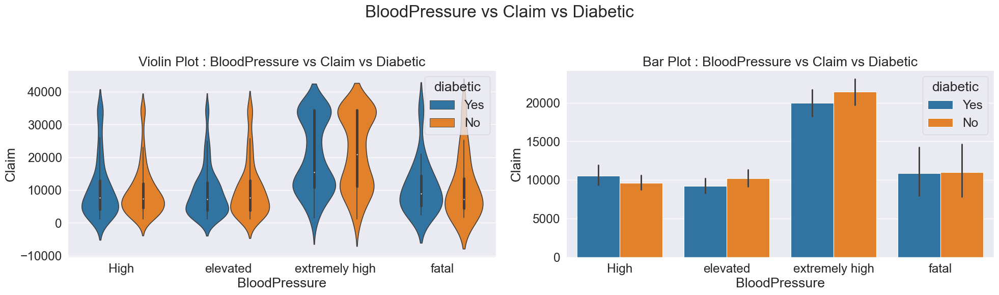

In [247]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=cat_df['bloodpressure'], y=df['claim'], hue=df['diabetic'], ax=ax1)
ax1.set_title('Violin Plot : BloodPressure vs Claim vs Diabetic')
ax1.set_xlabel('BloodPressure')
ax1.set_ylabel('Claim')

sns.barplot(x=cat_df['bloodpressure'], y=df['claim'], hue=df['diabetic'], ax=ax2)
ax2.set_title('Bar Plot : BloodPressure vs Claim vs Diabetic')
ax2.set_xlabel('BloodPressure')
ax2.set_ylabel('Claim')

plt.suptitle('BloodPressure vs Claim vs Diabetic', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Categorical BloodPressure v/s Claim v/s Region**

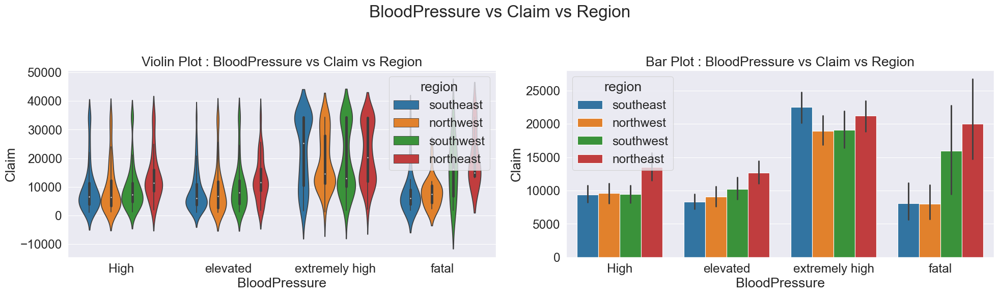

In [248]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=cat_df['bloodpressure'], y=df['claim'], hue=df['region'], ax=ax1)
ax1.set_title('Violin Plot : BloodPressure vs Claim vs Region')
ax1.set_xlabel('BloodPressure')
ax1.set_ylabel('Claim')

sns.barplot(x=cat_df['bloodpressure'], y=df['claim'], hue=df['region'], ax=ax2)
ax2.set_title('Bar Plot : BloodPressure vs Claim vs Region')
ax2.set_xlabel('BloodPressure')
ax2.set_ylabel('Claim')

plt.suptitle('BloodPressure vs Claim vs Region', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

**Categorical BloodPressure v/s Claim v/s Children**

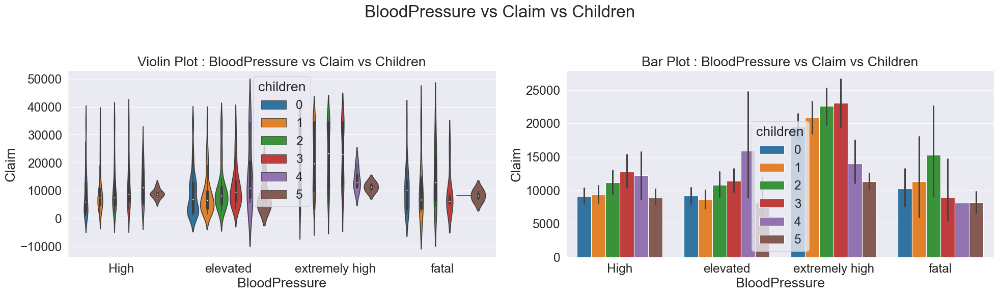

In [249]:
fig = plt.figure(figsize=(20, 6))
(ax1, ax2) = fig.subplots(1, 2)

sns.violinplot(x=cat_df['bloodpressure'], y=df['claim'], hue=df['children'], ax=ax1)
ax1.set_title('Violin Plot : BloodPressure vs Claim vs Children')
ax1.set_xlabel('BloodPressure')
ax1.set_ylabel('Claim')

sns.barplot(x=cat_df['bloodpressure'], y=df['claim'], hue=df['children'], ax=ax2)
ax2.set_title('Bar Plot : BloodPressure vs Claim vs Children')
ax2.set_xlabel('BloodPressure')
ax2.set_ylabel('Claim')

plt.suptitle('BloodPressure vs Claim vs Children', fontsize=24)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

## Numberical To Numerical Features

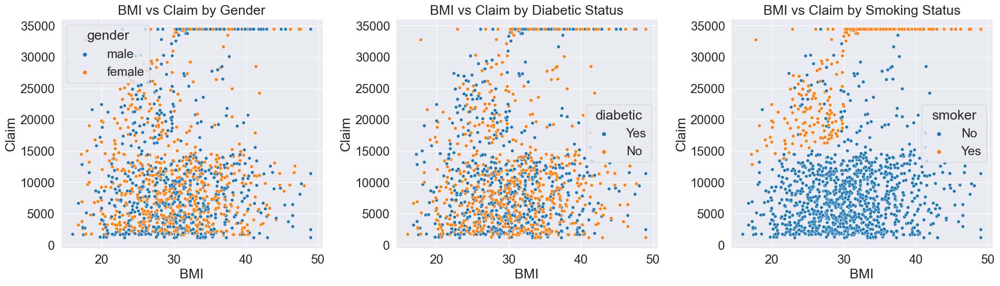

In [250]:
# Create the figure and subplots
fig = plt.figure(figsize=(20, 6))
(ax1, ax2, ax3) = fig.subplots(1, 3)

# Scatter plot for BMI vs Claim by Gender
sns.scatterplot(x=df['bmi'], y=df['claim'], hue=df['gender'], ax=ax1)
ax1.set_title('BMI vs Claim by Gender')
ax1.set_xlabel('BMI')
ax1.set_ylabel('Claim')

# Scatter plot for BMI vs Claim by Diabetic status
sns.scatterplot(x=df['bmi'], y=df['claim'], hue=df['diabetic'], ax=ax2)
ax2.set_title('BMI vs Claim by Diabetic Status')
ax2.set_xlabel('BMI')
ax2.set_ylabel('Claim')

# Scatter plot for BMI vs Claim by Smoking status
sns.scatterplot(x=df['bmi'], y=df['claim'], hue=df['smoker'], ax=ax3)
ax3.set_title('BMI vs Claim by Smoking Status')
ax3.set_xlabel('BMI')
ax3.set_ylabel('Claim')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()


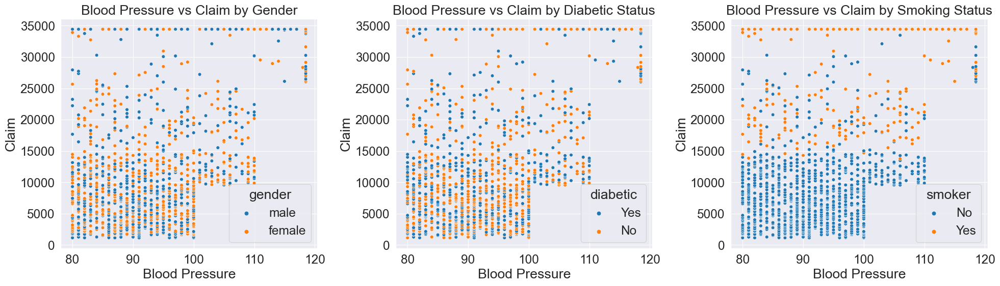

In [251]:
# Create the figure and subplots
fig = plt.figure(figsize=(20, 6))
(ax1, ax2, ax3) = fig.subplots(1, 3)

# Scatter plot for Blood Pressure vs Claim by Gender
sns.scatterplot(x=df['bloodpressure'], y=df['claim'], hue=df['gender'], ax=ax1)
ax1.set_title('Blood Pressure vs Claim by Gender')
ax1.set_xlabel('Blood Pressure')
ax1.set_ylabel('Claim')

# Scatter plot for Blood Pressure vs Claim by Diabetic status
sns.scatterplot(x=df['bloodpressure'], y=df['claim'], hue=df['diabetic'], ax=ax2)
ax2.set_title('Blood Pressure vs Claim by Diabetic Status')
ax2.set_xlabel('Blood Pressure')
ax2.set_ylabel('Claim')

# Scatter plot for Blood Pressure vs Claim by Smoking status
sns.scatterplot(x=df['bloodpressure'], y=df['claim'], hue=df['smoker'], ax=ax3)
ax3.set_title('Blood Pressure vs Claim by Smoking Status')
ax3.set_xlabel('Blood Pressure')
ax3.set_ylabel('Claim')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


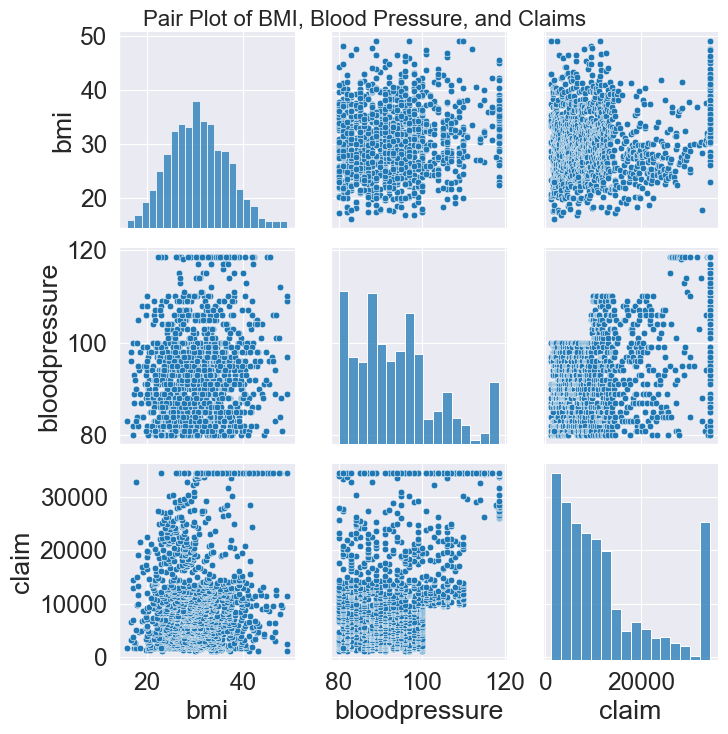

In [259]:
pair_plot = sns.pairplot(df[['bmi','bloodpressure','claim']])
pair_plot.fig.suptitle('Pair Plot of BMI, Blood Pressure, and Claims', fontsize=16)
pair_plot.fig.subplots_adjust(top=0.95)

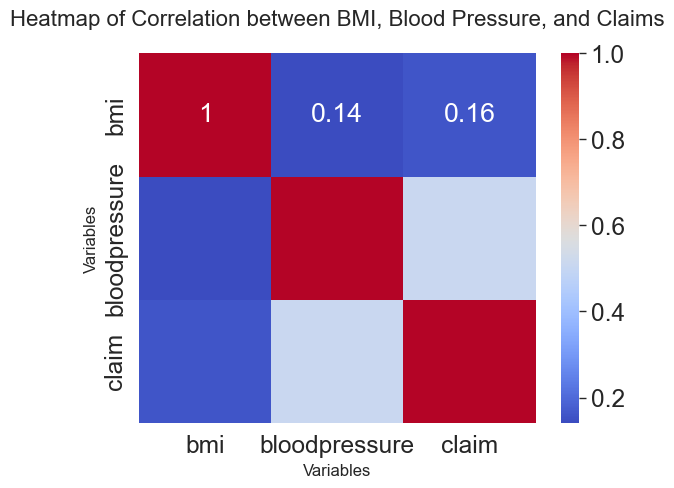

In [263]:
# Calculate the correlation matrix
corr_matrix = df[['bmi', 'bloodpressure', 'claim']].corr()

# Create a heatmap
sns.heatmap(df[['bmi','bloodpressure','claim']].corr(),annot=True,cmap='coolwarm')

# Set the title and subtitles
plt.title('Heatmap of Correlation between BMI, Blood Pressure, and Claims', fontsize=16, pad=20)
plt.xlabel('Variables', fontsize=12)
plt.ylabel('Variables', fontsize=12)

# Display the heatmap
plt.show()

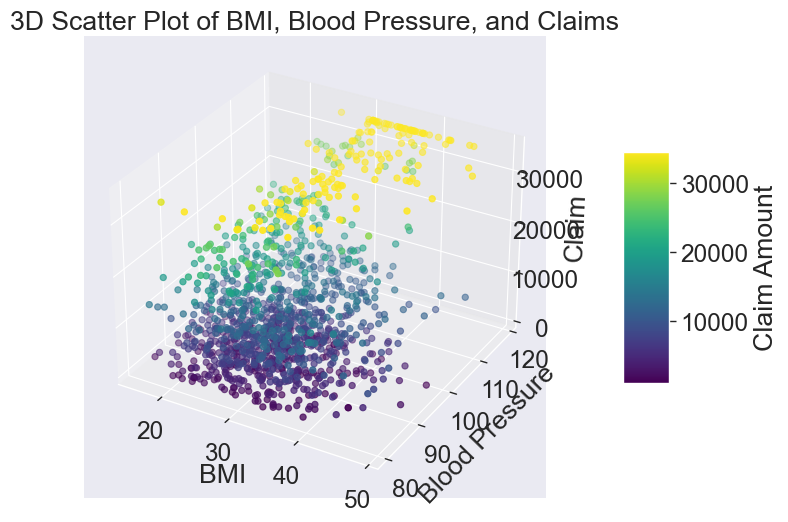

In [267]:
# Create a figure and a 3D axis
fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(df['bmi'], df['bloodpressure'], df['claim'], c=df['claim'], cmap='viridis', marker='o')

# Set labels
ax.set_xlabel('BMI')
ax.set_ylabel('Blood Pressure')
ax.set_zlabel('Claim')

# Set title
plt.title('3D Scatter Plot of BMI, Blood Pressure, and Claims')

# Add color bar
cbar = plt.colorbar(sc, ax=ax, shrink=0.5, aspect=5)
cbar.set_label('Claim Amount')

# Display the plot
plt.show()

## Feature Engineering

### Log Transformation

In [10]:
def log_transformation(val):
    return np.log(val)

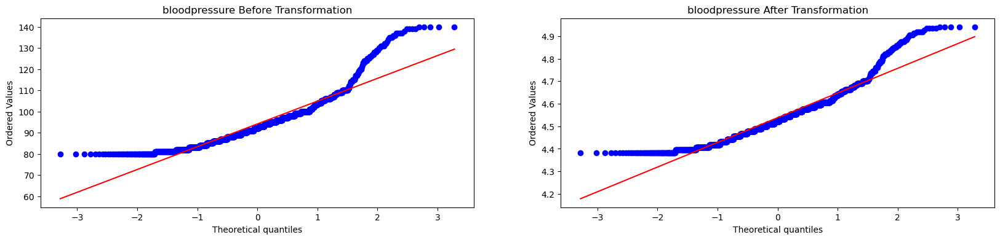

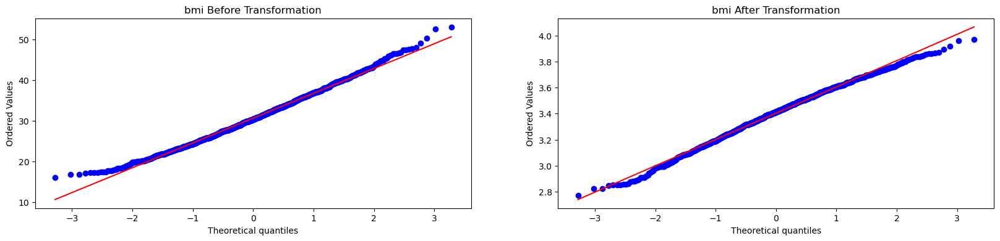

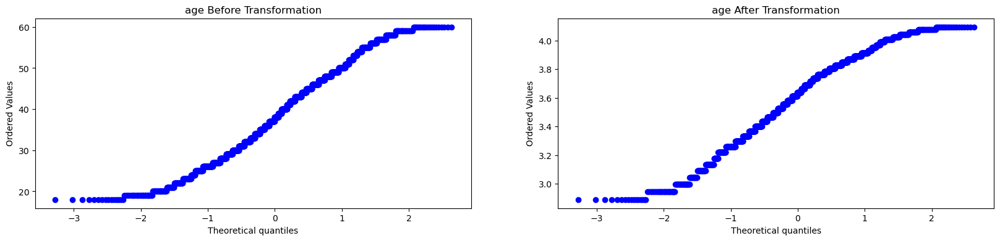

In [11]:
num_cols = ['bloodpressure','bmi','age']
temp_df = deepcopy (df)
for col in num_cols:
    plt.figure(figsize=(20,4))
    plt.subplot(121)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.title(f'{col} Before Transformation')    
    
    temp_df[col] = df[col].apply(log_transformation)
    
    plt.subplot(122)
    stats.probplot(temp_df[col], dist="norm", plot=plt)
    plt.title(f'{col} After Transformation')
    plt.show()

### Feature Scalling

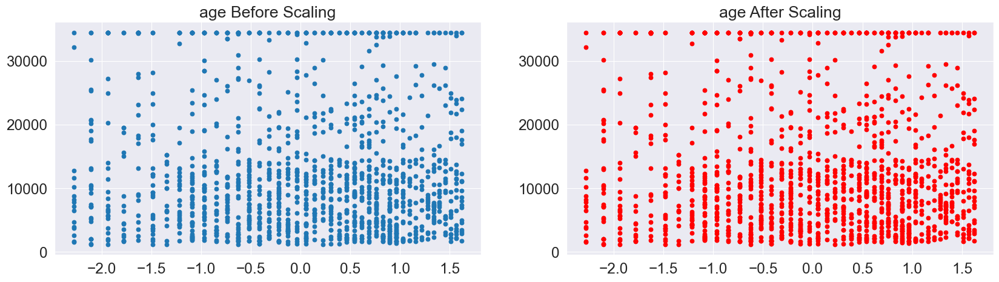

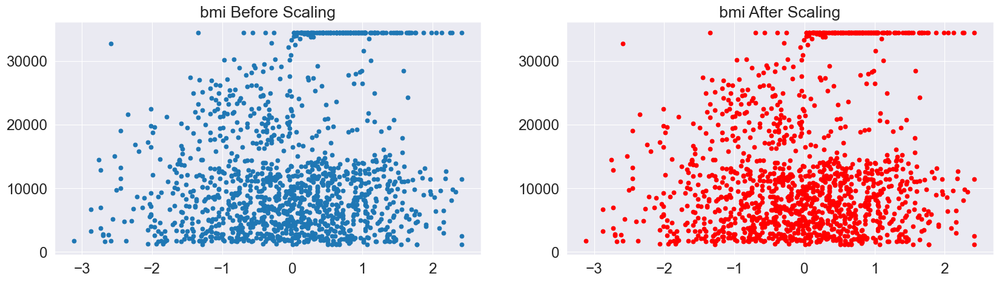

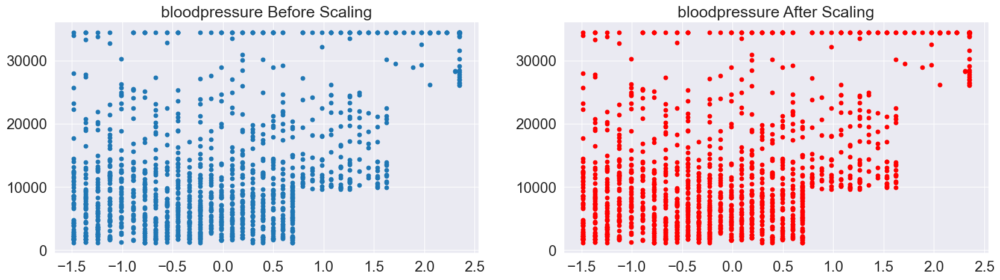

In [274]:
num_cols = ['age','bmi','bloodpressure']
for col in num_cols:
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 5))
    ax1.scatter(temp_df[col], temp_df['claim'])
    ax1.set_title(f"{col} Before Scaling") 
    scaler = StandardScaler()
    scaler.fit(temp_df[[col]]) 
    temp_df[col] = scaler.transform(temp_df[[col]])
    ax2.scatter(temp_df[col], temp_df['claim'],color='red')
    ax2.set_title(f"{col} After Scaling")
    plt.show()

## Linear Relationship

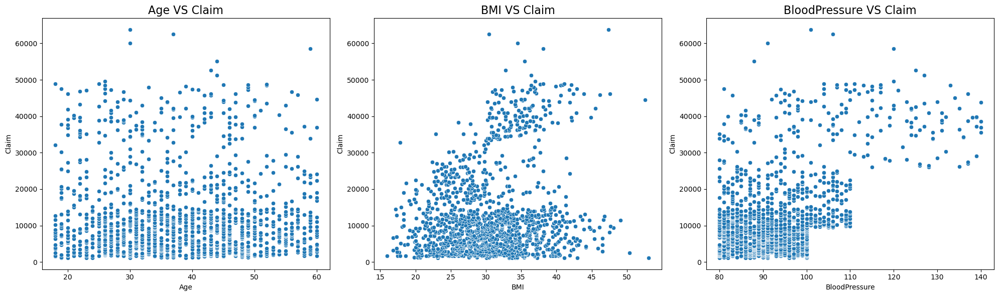

In [33]:
fig = plt.figure(figsize=(20, 6))

# Subplot 1: Age vs Claim
ax1 = fig.add_subplot(131)
sns.scatterplot(x=df['age'], y=df['claim'], ax=ax1)
ax1.set_xlabel('Age')
ax1.set_ylabel('Claim')
ax1.set_title('Age VS Claim', fontsize=16)

# Subplot 2: BMI vs Claim
ax2 = fig.add_subplot(132)
sns.scatterplot(x=df['bmi'], y=df['claim'], ax=ax2)
ax2.set_xlabel('BMI')
ax2.set_ylabel('Claim')
ax2.set_title('BMI VS Claim', fontsize=16)

# Subplot 3: Blood Pressure vs Claim
ax3 = fig.add_subplot(133)
sns.scatterplot(x=df['bloodpressure'], y=df['claim'], ax=ax3)
ax3.set_xlabel('BloodPressure')
ax3.set_ylabel('Claim')
ax3.set_title('BloodPressure VS Claim', fontsize=16)

plt.tight_layout()
plt.show()

## Multicollinearity

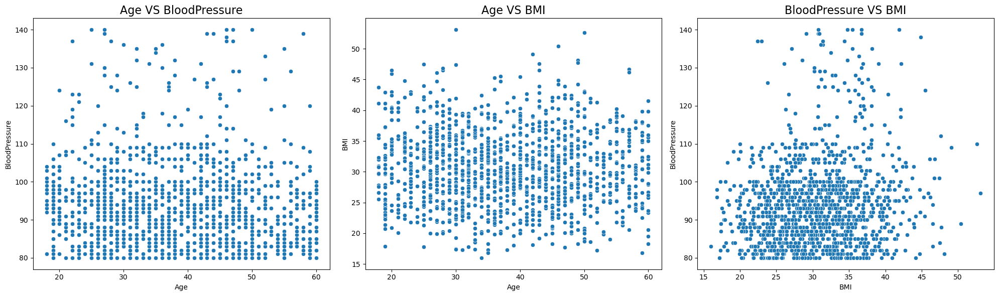

In [34]:
fig = plt.figure(figsize=(20, 6))

# Subplot 1: Age vs Blood Pressure
ax1 = fig.add_subplot(131)
sns.scatterplot(x=df['age'], y=df['bloodpressure'], ax=ax1)
ax1.set_xlabel('Age')
ax1.set_ylabel('BloodPressure')
ax1.set_title('Age VS BloodPressure', fontsize=16)

# Subplot 2: Age vs BMI
ax2 = fig.add_subplot(132)
sns.scatterplot(x=df['age'], y=df['bmi'], ax=ax2)
ax2.set_xlabel('Age')
ax2.set_ylabel('BMI')
ax2.set_title('Age VS BMI', fontsize=16)

# Subplot 3: Blood Pressure vs BMI
ax3 = fig.add_subplot(133)
sns.scatterplot(x=df['bmi'], y=df['bloodpressure'], ax=ax3)
ax3.set_xlabel('BMI')
ax3.set_ylabel('BloodPressure')
ax3.set_title('BloodPressure VS BMI', fontsize=16)

plt.tight_layout()
plt.show()

<Axes: >

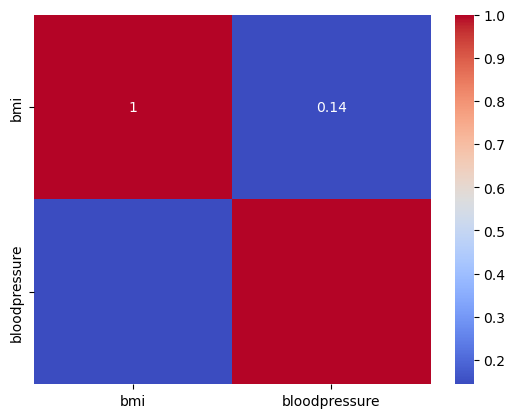

In [35]:
sns.heatmap(df[['bmi','bloodpressure']].corr(),annot=True,cmap='coolwarm')

**Assumption of Linear Regression:**
There is No Correlation between Input Features

## Normality of Residual

In [36]:
residual = y_test - y_pred

C:\Users\neera\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


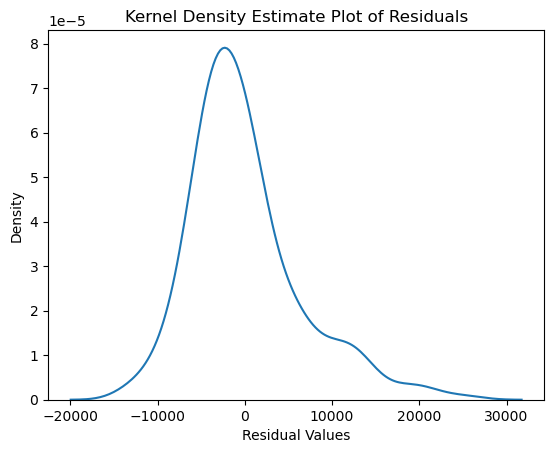

In [37]:
sns.kdeplot(residual)
plt.title('Kernel Density Estimate Plot of Residuals')
plt.xlabel('Residual Values')
plt.ylabel('Density')
plt.show()

In [38]:
residual.skew()

1.1280143008301373

## Homoscedasticity

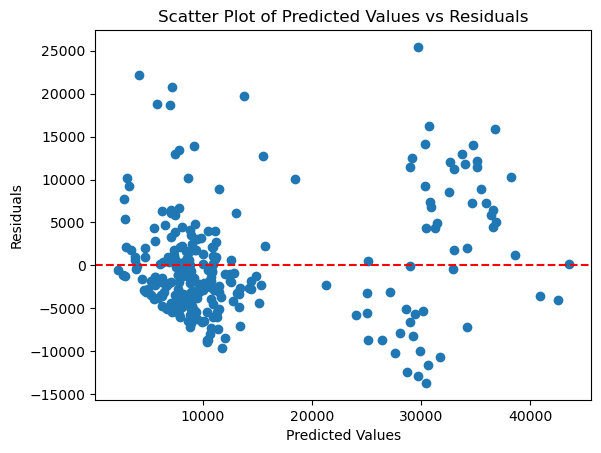

In [39]:
plt.scatter(y_pred, residual)
plt.axhline(y=0, color='r', linestyle='--')  # Add a horizontal line at y=0 for reference
plt.title('Scatter Plot of Predicted Values vs Residuals')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

## Autocorrelation of Residuals

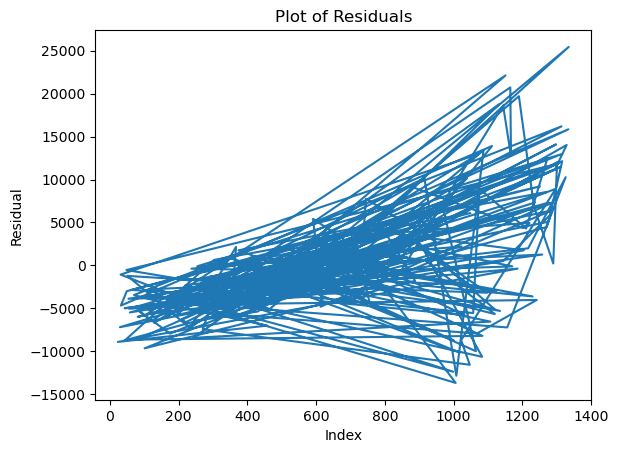

In [40]:
plt.plot(residual)
plt.title('Plot of Residuals')
plt.xlabel('Index')
plt.ylabel('Residual')
plt.show()

## Model Building and Training

In [12]:
# Split the data into features and target
X = temp_df.drop(columns=['claim'])
y = temp_df['claim']  # Changed to series for simplicity

# Splitting the data
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [13]:
# Categorical columns and preprocessor
numeric_cols = ['age', 'bmi', 'bloodpressure']
categorical_cols = ['gender', 'diabetic', 'smoker', 'region']

# Defining the pipeline
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean'))
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(sparse=False,drop='first'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Creating the pipeline with preprocessing and linear regression
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])

In [14]:
# Fit and transform the training data, and transform the test data
x_train = pipeline.fit_transform(x_train)
x_test = pipeline.transform(x_test)

C:\Users\neera\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [15]:
x_train

array([[3.4657359 , 3.28466357, 4.74493213, ..., 1.        , 0.        ,
        0.        ],
       [3.93182563, 3.24649099, 4.41884061, ..., 1.        , 0.        ,
        0.        ],
       [3.4657359 , 3.66356165, 4.56434819, ..., 1.        , 0.        ,
        0.        ],
       ...,
       [3.58351894, 3.40784192, 4.86753445, ..., 1.        , 0.        ,
        0.        ],
       [3.61091791, 3.5085559 , 4.4308168 , ..., 1.        , 0.        ,
        0.        ],
       [3.93182563, 3.73528583, 4.66343909, ..., 0.        , 1.        ,
        0.        ]])

In [16]:
# Create and train the model
model = LinearRegression()
model.fit(x_train, y_train)

LinearRegression()

In [17]:
# Predict on the test data
y_pred = model.predict(x_test)

In [18]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 40997398.70925462


In [16]:
# Optionally, inspect predictions
print(y_pred[:10])

[ 8786.03485634  6295.29795412  7716.344559    2956.30154089
  8931.22284614  3271.74007787 30417.27356357 31454.95206713
  8879.07379758 10462.0180434 ]


## Evaluating the Model

In [19]:
# Compute Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)

# Compute Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Compute Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Compute R-squared (R2) score
r2 = r2_score(y_test, y_pred)

# Adjusted R-squared calculation
n = x_train.shape[0]  # number of samples
p = x_train.shape[1]  # number of features/predictors
adjusted_r2 = 1 - (1 - r2) * ((n - 1) / (n - p - 1))

# Print out the metrics
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'R-squared (R2) Score: {r2:.4f}')
print(f'Adjusted R-squared Score: {adjusted_r2:.4f}')

Mean Absolute Error (MAE): 4759.8471
Mean Squared Error (MSE): 40997398.7093
Root Mean Squared Error (RMSE): 6402.9211
R-squared (R2) Score: 0.7505
Adjusted R-squared Score: 0.7484


In [20]:
linear_reg = LinearRegression()
linear_reg.fit(x_train, y_train)
linear_reg_predictions = linear_reg.predict(x_test)
linear_reg_mae = mean_absolute_error(y_test, linear_reg_predictions)
print("Linear Regression Mean Absolute Error:", linear_reg_mae)

Linear Regression Mean Absolute Error: 4759.847132298931


## Ridge Regression

In [21]:
# Define Ridge Regression model
ridge = Ridge()

# Define Ridge regression and hyperparameters
ridge_parameters = {'alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 1, 5, 10, 20, 30, 35, 40, 45, 50, 55, 100]}

# GridSearchCV for Ridge Regression
ridge_regressor_grid = GridSearchCV(ridge, ridge_parameters, scoring='neg_mean_squared_error', cv=5)

# RandomizedSearchCV for Ridge Regression
ridge_regressor_random = RandomizedSearchCV(ridge, ridge_parameters, scoring='neg_mean_squared_error', n_iter=10, cv=5, random_state=42)

# Fitting the models
ridge_regressor_grid.fit(x_train, y_train)
ridge_regressor_random.fit(x_train, y_train)

# Making predictions
ridge_grid_predictions = ridge_regressor_grid.best_estimator_.predict(x_test)
ridge_random_predictions = ridge_regressor_random.best_estimator_.predict(x_test)

# Evaluating the models
ridge_grid_mae = mean_absolute_error(y_test, ridge_grid_predictions)
ridge_random_mae = mean_absolute_error(y_test, ridge_random_predictions)

print("Ridge Regression Grid Search Mean Absolute Error:", ridge_grid_mae)
print("Ridge Regression Random Search Mean Absolute Error:", ridge_random_mae)


Ridge Regression Grid Search Mean Absolute Error: 4760.000276866588
Ridge Regression Random Search Mean Absolute Error: 4759.847132452138


## Lasso Regression

In [22]:
# Define Lasso regression model
lasso = Lasso()

# Define Lasso regression and hyperparameters
lasso_parameters = {'alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 1, 5, 10, 20, 30, 35, 40, 45, 50, 55, 100]}

# GridSearchCV for Lasso Regression
lasso_regressor_grid = GridSearchCV(lasso, lasso_parameters, scoring='neg_mean_squared_error', cv=5)

# RandomizedSearchCV for Lasso Regression
lasso_regressor_random = RandomizedSearchCV(lasso, lasso_parameters, scoring='neg_mean_squared_error', n_iter=10, cv=5, random_state=42)

# Fitting the models
lasso_regressor_grid.fit(x_train, y_train)
lasso_regressor_random.fit(x_train, y_train)

# Making predictions
lasso_grid_predictions = lasso_regressor_grid.best_estimator_.predict(x_test)
lasso_random_predictions = lasso_regressor_random.best_estimator_.predict(x_test)

# Evaluating the models
lasso_grid_mae = mean_absolute_error(y_test, lasso_grid_predictions)
lasso_random_mae = mean_absolute_error(y_test, lasso_random_predictions)

print("Lasso Regression Grid Search Mean Absolute Error:", lasso_grid_mae)
print("Lasso Regression Random Search Mean Absolute Error:", lasso_random_mae)

C:\Users\neera\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.908e+10, tolerance: 1.223e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\neera\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.862e+10, tolerance: 1.250e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\neera\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.928e+10, toleranc

Lasso Regression Grid Search Mean Absolute Error: 4789.30702981379
Lasso Regression Random Search Mean Absolute Error: 4789.30702981379


## ElasticNet Regression


In [35]:
# Define ElasticNet regression model
elasticnet = ElasticNet()

# Define hyperparameters for grid and random search
elasticnet_parameters = {'alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 1, 5, 10, 20, 30, 35, 40, 45, 50, 55, 100],
                         'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]}

# GridSearchCV for ElasticNet Regression
elasticnet_regressor_grid = GridSearchCV(elasticnet, elasticnet_parameters, scoring='neg_mean_squared_error', cv=5)

# RandomizedSearchCV for ElasticNet Regression
elasticnet_regressor_random = RandomizedSearchCV(elasticnet, elasticnet_parameters, scoring='neg_mean_squared_error', n_iter=10, cv=5, random_state=42)

# Fitting the models
elasticnet_regressor_grid.fit(x_train, y_train)
elasticnet_regressor_random.fit(x_train, y_train)

# Making predictions
elasticnet_grid_predictions = elasticnet_regressor_grid.best_estimator_.predict(x_test)
elasticnet_random_predictions = elasticnet_regressor_random.best_estimator_.predict(x_test)

# Calculating Mean Absolute Error (MAE)
elasticnet_grid_mae = mean_absolute_error(y_test, elasticnet_grid_predictions)
elasticnet_random_mae = mean_absolute_error(y_test, elasticnet_random_predictions)

C:\Users\neera\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.911e+10, tolerance: 1.223e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\neera\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.875e+10, tolerance: 1.250e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\neera\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.934e+10, toleranc

In [36]:
print("ElasticNet Regression Grid Search Mean Absolute Error:", elasticnet_grid_mae)
print("ElasticNet Regression Random Search Mean Absolute Error:", elasticnet_random_mae)

ElasticNet Regression Grid Search Mean Absolute Error: 4764.972532869298
ElasticNet Regression Random Search Mean Absolute Error: 4764.972532869298


## Choose the best model based on Mean Squared Error

In [37]:
best_model = min([
    ("Linear Regression", linear_reg_mae),
    ("Ridge Regression (Grid Search)", ridge_grid_mae),
    ("Ridge Regression (Random Search)", ridge_random_mae),
    ("Lasso Regression (Grid Search)", lasso_grid_mae),
    ("Lasso Regression (Random Search)", lasso_random_mae),
    ("ElasticNet Regression (Grid Search)", elasticnet_grid_mae),
    ("ElasticNet Regression (Random Search)", elasticnet_random_mae)
], key=lambda x: x[1])

print(f"\nBest Model: {best_model[0]}")
print(f"Best Model Mean Absolute Error: {best_model[1]}")


Best Model: Linear Regression
Best Model Mean Absolute Error: 4759.847132298931


In [44]:
df.sample()

,index,PatientID,age,gender,bmi,bloodpressure,diabetic,children,smoker,region,claim
867,867,868,46.0,male,24.7,84,No,0,No,northeast,12323.94


## Deploying Model

In [118]:
# Dummy data for fitting
data = pd.DataFrame({
    'age': [23, 45, 56, 28],
    'sex': ['male', 'female', 'female', 'male'],
    'bmi': [22.5, 27.4, 30.2, 25.3],
    'children': [1, 3, 2, 0],
    'smoker': ['yes', 'no', 'no', 'yes'],
    'region': ['southwest', 'southeast', 'northwest', 'northeast'],
    'feature1': [1, 0, 0, 1],
    'feature2': [2, 3, 1, 2],
    'charges': [16884.92, 1725.55, 4449.46, 21984.47]
})

In [119]:
# Define feature columns and target
feature_columns = ['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'feature1', 'feature2']
target_column = 'charges'

In [120]:
# Define preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), ['age', 'bmi', 'children', 'feature1', 'feature2']),
        ('cat', OneHotEncoder(), ['sex', 'smoker', 'region'])
    ])

In [121]:
# Define the pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

In [122]:
# Split data into features and target
X = data[feature_columns]
y = data[target_column]

In [123]:
# Fit the pipeline
pipeline.fit(X, y)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['age', 'bmi', 'children',
                                                   'feature1', 'feature2']),
                                                 ('cat', OneHotEncoder(),
                                                  ['sex', 'smoker',
                                                   'region'])])),
                ('regressor', LinearRegression())])

In [124]:
# Save the pipeline
with open('insurance.pkl', 'wb') as file:
    pickle.dump(pipeline, file)

In [125]:
# Load the pipeline
with open('insurance.pkl', 'rb') as file:
    loaded_pipeline = pickle.load(file)

In [126]:
# Assume user input
test_input = np.array([27, 'female', 41.4, 1, 'no', 'northwest', 0, 0]).reshape(1, -1)
test_input_df = pd.DataFrame(test_input, columns=feature_columns)

In [129]:
# Make prediction
prediction = loaded_pipeline.predict(test_input_df)
print("Predicted insurance cost :", prediction)
print('Predicted Insurance Cost :', prediction[0])

Predicted insurance cost : [9737.05568692]
Predicted Insurance Cost : 9737.055686920563
